# Figure 6

## load packages

In [6]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.io.parsers import read_csv
import scanpy as sc
import numpy as np
from functools import reduce
from anndata import AnnData, read_h5ad
import collections
import scipy
import math
from matplotlib.colors import LinearSegmentedColormap
import random
from sklearn.mixture import GaussianMixture
from scipy.stats import poisson
pd.set_option('display.max_columns', 50)

/var/folders/_k/c0bkq2m10c5f4h7vq_0xfm_40000gn/T/ipykernel_14305/3043535915.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [51]:
sc.set_figure_params(dpi = 80)
sns.set_style("white")
sns.set_context("talk")
sns.set_style("ticks")

In [8]:
import decoupler as dc

In [9]:
greens_r = sns.blend_palette(['black','#238b45', '#75c477', '#c8e9c1' ], as_cmap = True)
purples_r = sns.blend_palette(['black','#6a51a3', '#9e9bc8', '#dadaeb'], as_cmap = True)
oranges_r = sns.blend_palette(['black','#d94801', '#fd8e3d', '#fdd1a3'], as_cmap = True)

k27_k4 = sns.blend_palette(['#6a51a3', '#9e9bc8', '#dadaeb','#c8e9c1','#75c477','#238b45'], as_cmap = True)
k4_k27 = sns.blend_palette(['#238b45', '#75c477', '#c8e9c1' ,'#dadaeb','#9e9bc8','#6a51a3' ], as_cmap = True)
lin_colors = {'Ectoderm':'#3787C0', 'Endoderm':'#FC6832', 'Mesoderm':'#DF2179', 'Pluripotency':'#58B669'}
Green='#238b45'
Purple='#6a51a3'
Orange='#d94801'



In [10]:
cols = ['grey','skyblue','orange','red']
cols2 = ['white','deepskyblue','orange','red','grey']

leg_dict2 = {'negative': 'grey','positive': 'skyblue','going up': 'orange','going down': 'red'}
coldict=dict(zip(list(pd.DataFrame([0,1,2,3,4]).astype('category')[0]), cols2))
leg_dict = {'negative': 'white', 'positive': 'deepskyblue', 'going up': 'orange', 'going down': 'red'}

## load tables

In [11]:
diff_exp = pd.read_csv('2024_03_23_difexp_genes_lineages.tsv',
                            index_col = 0, header = 0,low_memory = False, sep = '\t')





In [12]:
diff_exp.head(4)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,start,end
Gene,,,,,,,,
0610012G03Rik,17.511469,-0.091064,0.079912,-1.139552,2.544732e-01,2.768738e-01,Pluripotent,Mesoderm
0610030E20Rik,23.701250,-0.350503,0.050457,-6.946514,3.744240e-12,6.933019e-12,Pluripotent,Mesoderm
1110002L01Rik,57.210000,0.700928,0.045079,15.548920,1.618117e-54,9.067881e-54,Pluripotent,Mesoderm
1110004F10Rik,91.727260,-0.142277,0.035883,-3.965068,7.337516e-05,1.012621e-04,Pluripotent,Mesoderm


In [13]:
anova = pd.read_csv('20250124_annova_celltypes_staged.tsv',
                            index_col = 1, header = 0,low_memory = False, sep = '\t').drop(columns='Unnamed: 0')





In [14]:
anova.head(4)

,RNA_fold,RNA_p,K4_fold,K4_p,K27_fold,K27_p
gene,,,,,,
Xkr4,6.058661,32.761173,2.803580,6.128558,2.414330,7.396110
Rp1,1.382009,2.872815,0.646241,0.872978,3.887687,10.673917
Sox17,4.725642,23.199376,4.591581,17.633169,2.762117,19.198423
Mrpl15,1.307205,3.564293,1.080482,1.495961,1.612803,2.201373


In [15]:
metadata = pd.read_csv('20250215_metadata.tsv', index_col = 0, header = 0, low_memory= False, sep = '\t')

In [16]:
metadata.head(4)

,step,PT,UMAP1,UMAP2,lin,RT,lin2,RT_m,step_id
1,1,0.372537,11.126464,4.599585,ect1,mESCs,Pluripotent mESCs,0.0,1:ect1
2,2,0.463342,11.385221,4.509028,ect1,mESCs,Pluripotent mESCs,0.0,2:ect1
3,3,0.541758,11.454574,4.386492,ect1,mESCs,Pluripotent mESCs,0.0,3:ect1
4,4,0.605571,11.645337,4.233151,ect1,mESCs,Pluripotent mESCs,0.0,4:ect1


In [17]:
pd.crosstab(diff_exp['start'], diff_exp['end'])

end,Ectoderm,Endoderm,Mesoderm
start,,,
Pluripotent,10160,10160,10160


In [18]:
anova.shape

(17370, 6)

# start analysis

## normalise values and check

## check some QC

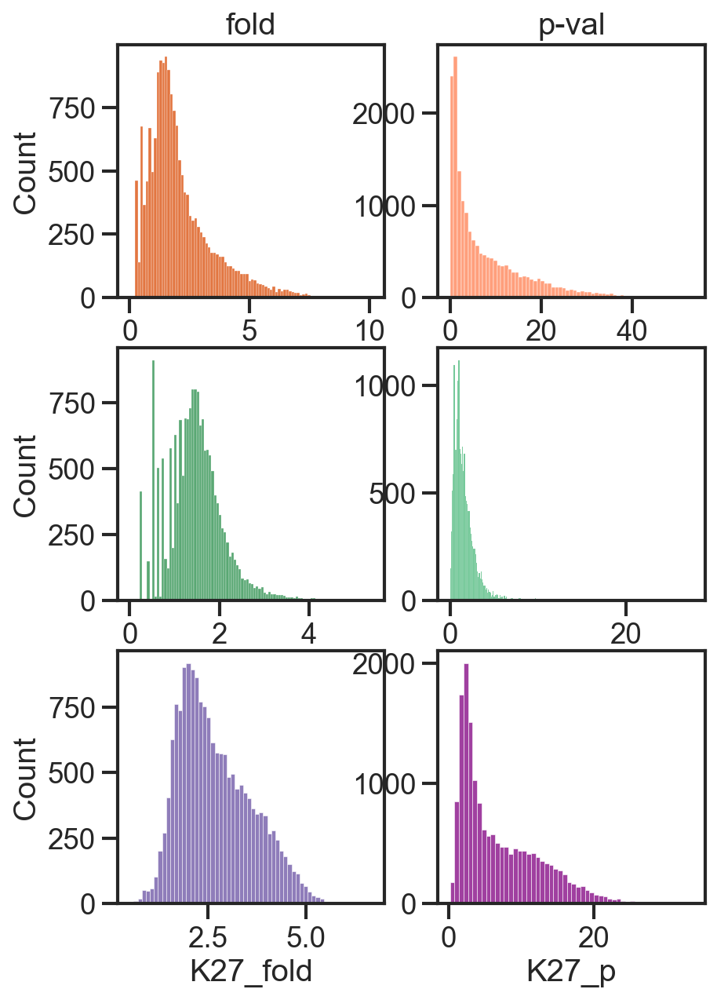

In [19]:
fig,ax = plt.subplots(3,2,figsize = (6,9)) 
                                #gridspec_kw={'hspace': 0.1, 'height_ratios':[2,2,2,2]})
      
ax = ax.flatten()
sns.histplot(anova['RNA_fold'], color = Orange,ax=ax[0])
sns.histplot(anova['RNA_p'], color = 'coral',ax=ax[1])
sns.histplot(anova['K4_fold'], color = Green,ax=ax[2])
sns.histplot(anova['K4_p'], color = 'mediumseagreen',ax=ax[3])
sns.histplot(anova['K27_fold'], color = Purple,ax=ax[4])
sns.histplot(anova['K27_p'],color = 'purple',ax=ax[5])

ax[1].set_ylabel('')
ax[3].set_ylabel('')
ax[5].set_ylabel('')

ax[0].set_title('fold')
ax[1].set_title('p-val')

plt.show()
plt.close()

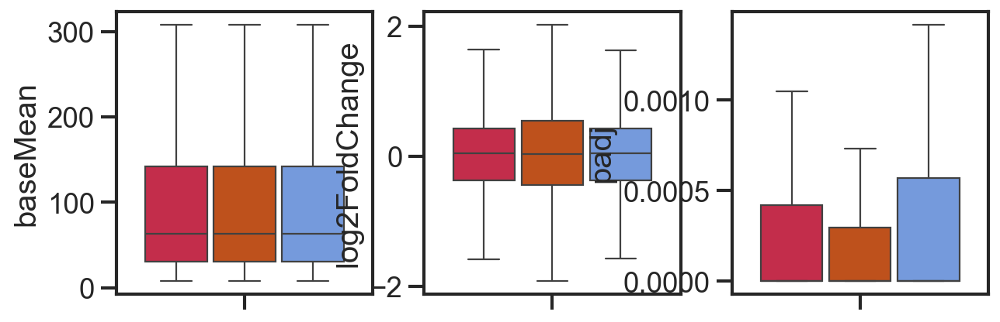

In [20]:
fig,ax = plt.subplots(1,3,figsize = (9,3)) 
                                #gridspec_kw={'hspace': 0.1, 'height_ratios':[2,2,2,2]})
      
ax = ax.flatten()
sns.boxplot(y = diff_exp['baseMean'], hue = diff_exp['end'],
             palette = ['crimson', Orange, 'cornflowerblue'],gap = 0.1,
             ax=ax[0], showfliers = False)
#sns.stripplot(y = diff_exp['baseMean'], hue = diff_exp['end'],dodge = True, s = 1,
#             palette = ['crimson', Orange, 'cornflowerblue'], #width=0.6,gap = 0.1,
#             ax=ax[0],)# showfliers = False)
sns.boxplot(y = diff_exp['log2FoldChange'], hue = diff_exp['end'],
             palette = ['crimson', Orange, 'cornflowerblue'],gap = 0.1,
             ax=ax[1], showfliers = False)
sns.boxplot(y = diff_exp['padj'], hue = diff_exp['end'],
             palette = ['crimson', Orange, 'cornflowerblue'],gap = 0.1,
             ax=ax[2], showfliers = False)
ax[0].legend([],frameon=False)
ax[1].legend([],frameon=False)
ax[2].legend([],frameon=False)
plt.show()

# start plots

## initialise some formulas and lists

## make umap plots

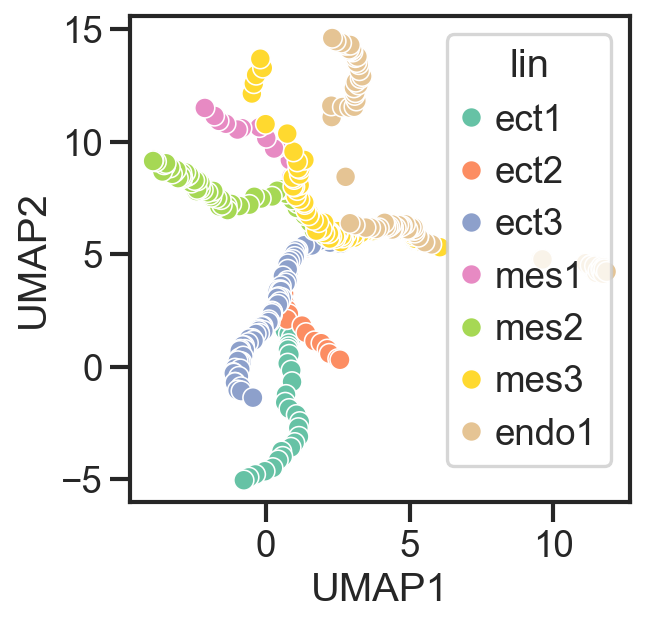

In [23]:
sns.scatterplot(data  = metadata,
               x = 'UMAP1',
               y = 'UMAP2',
               hue = 'lin', palette = 'Set2')
#plt.legend([], frameon = False)
plt.show()

In [24]:
adata = sc.read_h5ad('legacy/data/20230704_adata_all.h5ad')
adata

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'hour', 'celltype', 'celltype_general', 'lineage', 'lin_day', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_genes', 'S_score', 'G2M_score', 'phase', 'enrichment', 'coverage', 'QC', 'pseudotime', 'pseudotime2'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'celltype_general_colors', 'dataset_colors', 'day_colors', 'hour_colors', 'hvg', 'leiden', 'leiden_colors', 'lin_day_colors', 'lineage_colors', 'log1p', 'mark_colors', 'neighbors', 'old_celltype_colors', 'old_leiden_general_colors', 'old_leiden_merge_colors', 'pca', 'phase_colors', 'predicted_final_colors', 'predicted_id_E75_colors', 'predicted_id_E85_colors', 'replicates_colors', 'umap', 'umap_density_mark_par

In [25]:
UMAP_coord_allcells=pd.DataFrame(adata.obsm['X_umap'])

/var/folders/_k/c0bkq2m10c5f4h7vq_0xfm_40000gn/T/ipykernel_14305/3257182016.py:5: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.scatterplot(data=metadata, x='UMAP1', y='UMAP2', hue='RT', alpha = 0.5,


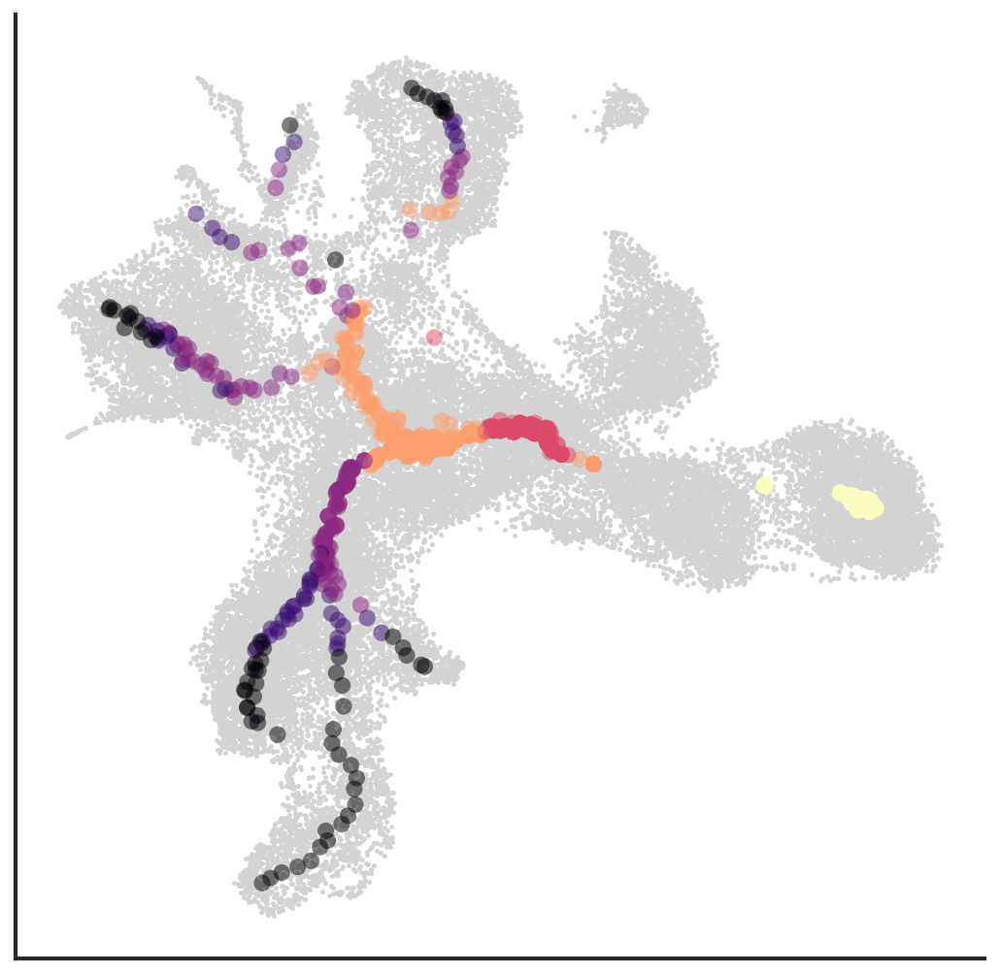

In [26]:
sns.set_style('white')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8,8))
sns.scatterplot(data=UMAP_coord_allcells, x=0, y=1, s=5, color='lightgrey', linewidth=0, ax=ax, alpha=1)
sns.scatterplot(data=metadata, x='UMAP1', y='UMAP2', hue='RT', alpha = 0.5,
                s=60, linewidth=0, ax=ax, palette=adata.uns['hour_colors'], legend=False)
sns.despine()
ax.tick_params(labelleft=False, labelbottom=False,)
ax.set_ylabel('')
ax.set_xlabel('')
plt.savefig('figs/UMAP_trajectories_RT.png')
plt.show()

In [27]:
lineages = pd.read_csv("/Users/mbloten1/Library/CloudStorage/OneDrive-UniversitédeLausanne/Documents/projects/phd/tchic/legacy/data/jupyter_notebooks/2023/fig5/20240202_9trajectories.csv", sep = ',', header = 0 ,index_col=0)
adata.obs[['ect1_ct', 'ect2_ct', 'ect3_ct', 'mes1_ct', 'mes2_ct', 'mes3_ct',
       'pluri1_ct', 'pluri2_ct', 'endo1_ct']] = lineages[['ect1_ct', 'ect2_ct', 'ect3_ct', 'mes1_ct', 'mes2_ct', 'mes3_ct',
       'pluri1_ct', 'pluri2_ct', 'endo1_ct']]

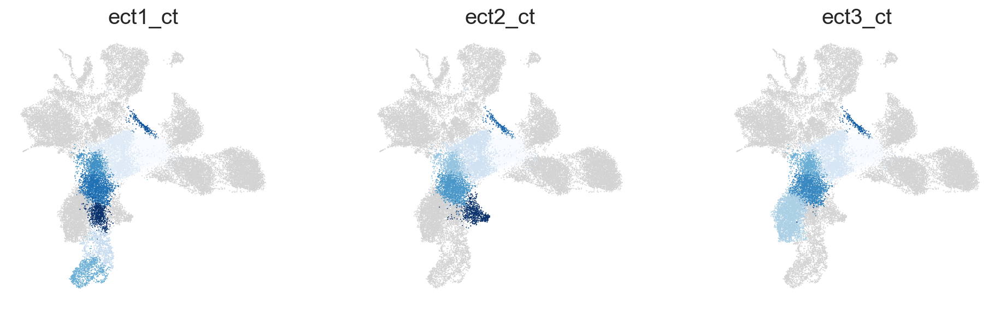

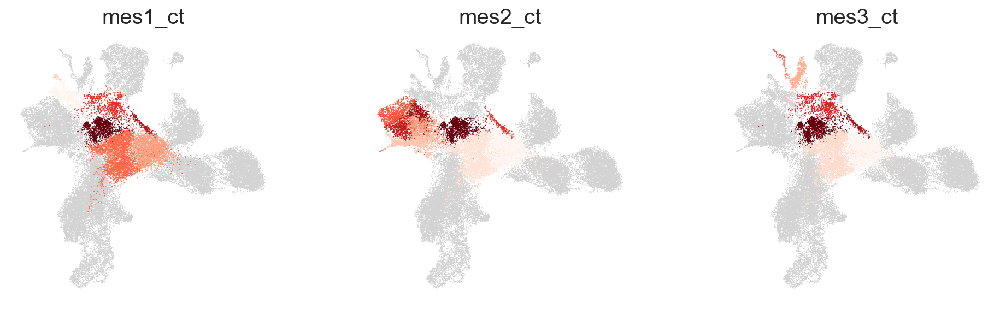

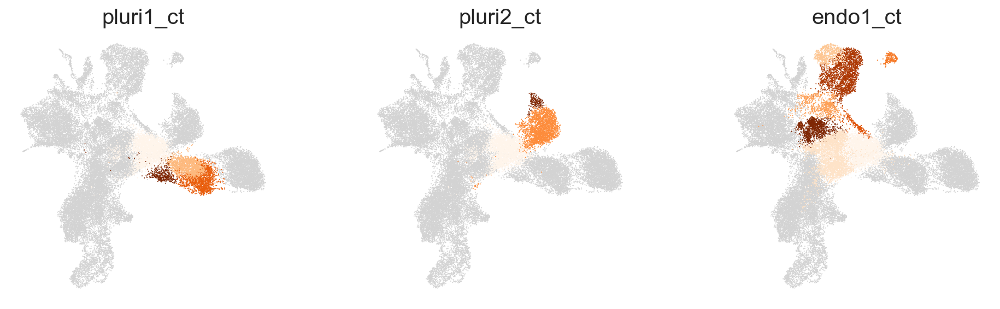

In [28]:
import warnings
warnings.simplefilter("ignore", UserWarning)

sc.pl.umap(adata,color = ['ect1_ct', 'ect2_ct', 'ect3_ct'],ncols = 3, frameon=False, legend_loc = None,palette = 'Blues', save='UMAP_trajectories_ectoderm.png')
sc.pl.umap(adata,color = ['mes1_ct', 'mes2_ct', 'mes3_ct'],ncols = 3, frameon=False, legend_loc = None,palette = 'Reds', save='UMAP_trajectories_mesoderm.png')
sc.pl.umap(adata,color = ['pluri1_ct', 'pluri2_ct', 'endo1_ct'],ncols = 3, frameon=False, legend_loc = None,palette = 'Oranges', save='UMAP_trajectories_endoderm.png')
        

## venn diagrams

In [29]:
endo_all = list(diff_exp[(diff_exp['end'] == 'Endoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] < -2)].sort_values(by = 'log2FoldChange',ascending=True).index)
meso_all = list(diff_exp[(diff_exp['end'] == 'Mesoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] < -2)].sort_values(by = 'log2FoldChange',ascending=True).index)
ecto_all = list(diff_exp[(diff_exp['end'] == 'Ectoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] < -2)].sort_values(by = 'log2FoldChange',ascending=True).index)
pluri_all = list(diff_exp[(diff_exp['end'] == 'Mesoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] > 2)].sort_values(by = 'log2FoldChange',ascending=False).index)

In [30]:
print(len(endo_all), len(meso_all), len(ecto_all), len(pluri_all))

404 327 299 320


In [31]:
from venny4py.venny4py import *

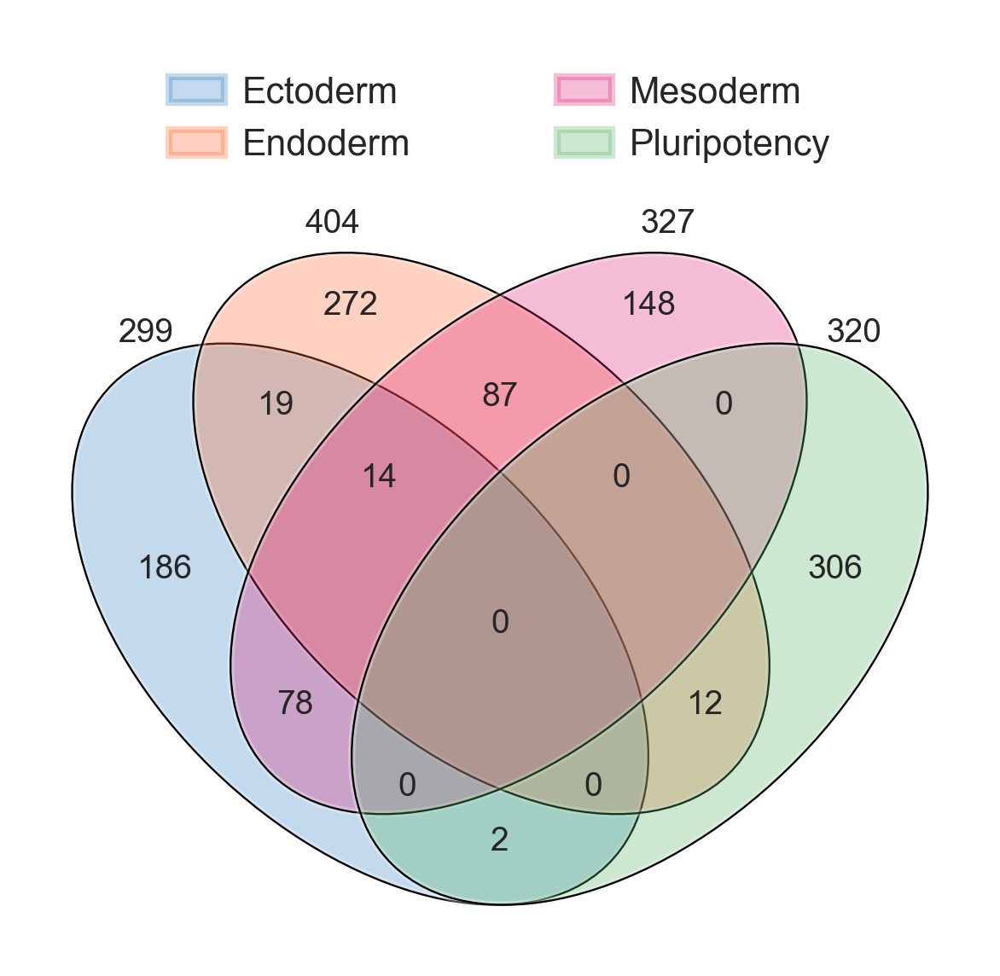

In [177]:
#dict of sets
sets = {
    'Ectoderm': set(ecto_all),
    'Endoderm': set(endo_all),
    'Mesoderm': set(meso_all),
    'Pluripotency': set(pluri_all)}
    
venny4py(sets=sets, colors = list(lin_colors.values()),)

plt.savefig('figs/venn4.png',bbox_inches='tight')
plt.show()

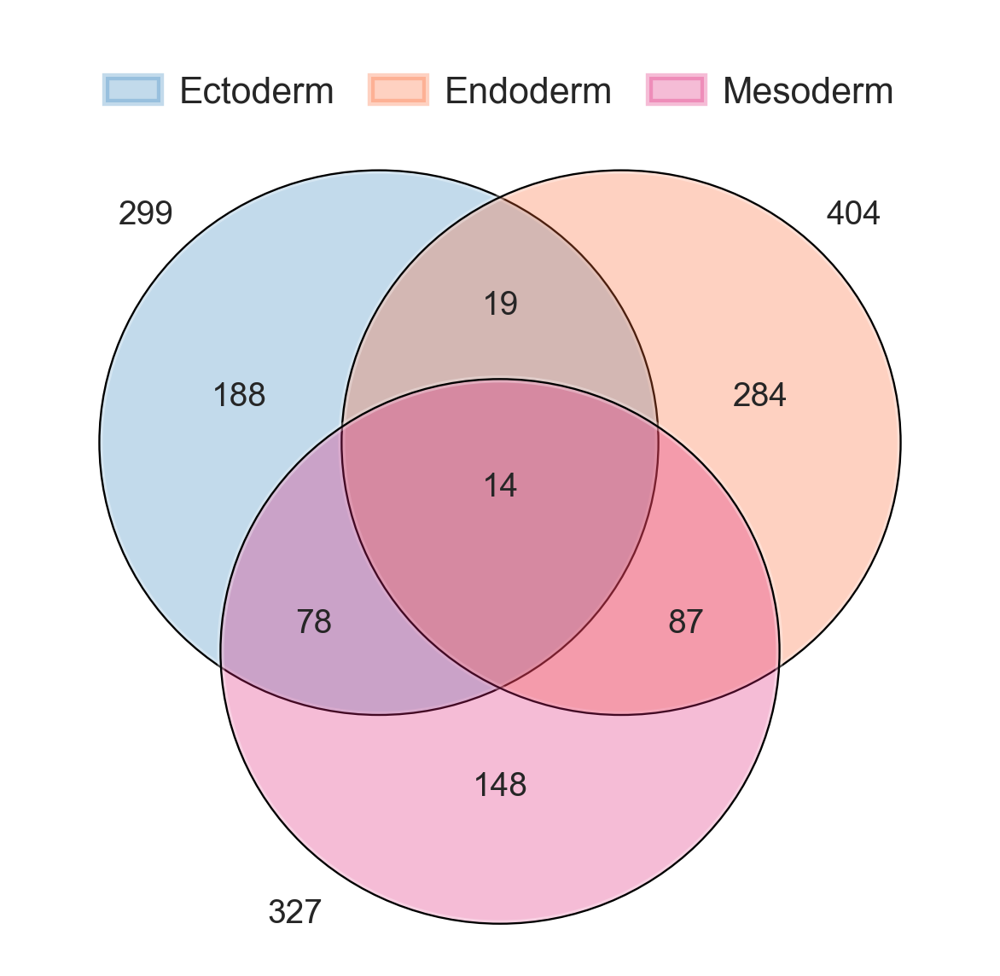

In [33]:
#dict of sets
sets = {
    'Ectoderm': set(ecto_all),
    'Endoderm': set(endo_all),
    'Mesoderm': set(meso_all)}
    
venny4py(sets=sets, colors = list(lin_colors.values())[0:3])
plt.show()

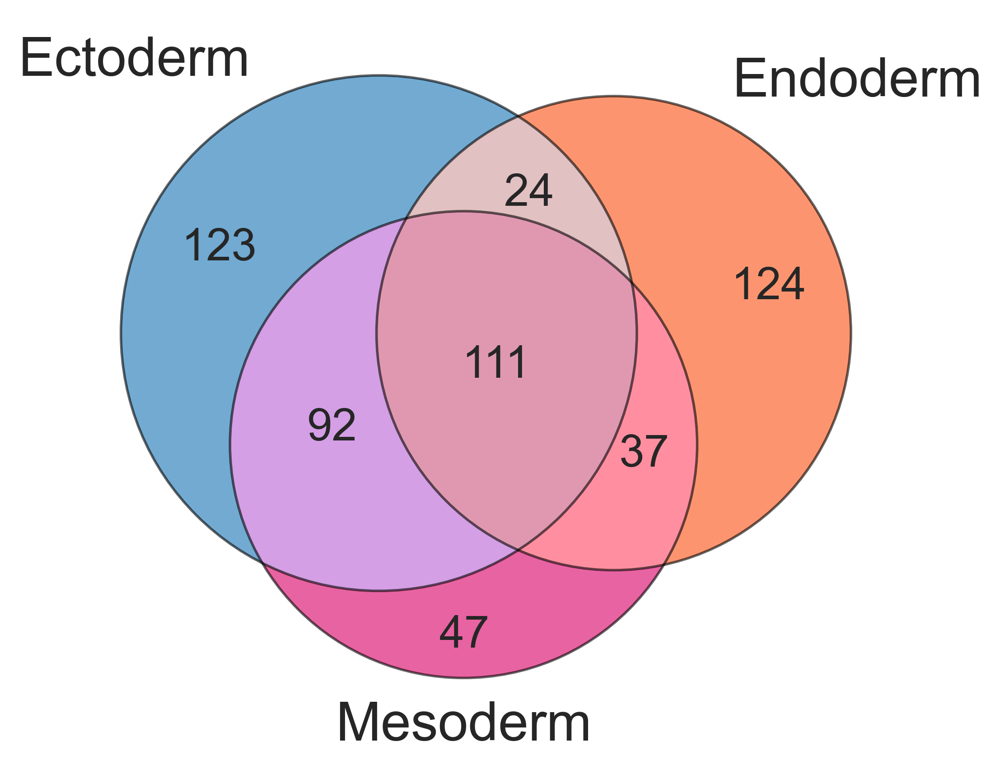

In [197]:
endo_n = list(diff_exp[(diff_exp['end'] == 'Endoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] > 2)].sort_values(by = 'log2FoldChange',ascending=True).index)
meso_n = list(diff_exp[(diff_exp['end'] == 'Mesoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] > 2)].sort_values(by = 'log2FoldChange',ascending=True).index)
ecto_n = list(diff_exp[(diff_exp['end'] == 'Ectoderm') & (diff_exp['padj'] < 0.05) & (diff_exp['log2FoldChange'] > 2)].sort_values(by = 'log2FoldChange',ascending=True).index)

fig,ax = plt.subplots(figsize = (6,6))
venn3([set(ecto_n),set(endo_n),set(meso_n)],set_colors = list(lin_colors.values())[0:3],
      set_labels = list(lin_colors.keys())[0:3],ax=ax,
      alpha = 0.7)
c = venn3_circles([set(ecto_n),set(endo_n),set(meso_n)],color = 'black',linewidth = 1,ax=ax, 
      alpha = 0.6)

plt.savefig('figs/venn3_neg.png',bbox_inches='tight')
plt.show()

In [34]:
from matplotlib_venn import venn3, venn3_circles

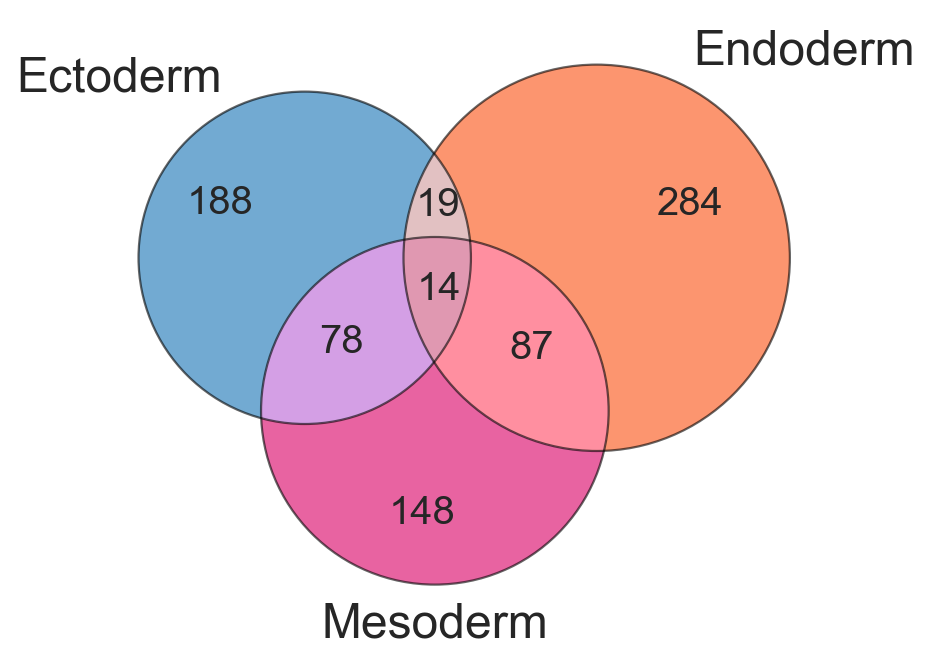

In [174]:
fig,ax = plt.subplots(figsize = (6,6))
venn3([set(ecto_all),set(endo_all),set(meso_all)],set_colors = list(lin_colors.values())[0:3],
      set_labels = list(lin_colors.keys())[0:3],ax=ax,
      alpha = 0.7)
c = venn3_circles([set(ecto_all),set(endo_all),set(meso_all)],color = 'black',linewidth = 1,ax=ax, 
      alpha = 0.6)

plt.savefig('figs/venn3.png',bbox_inches='tight')
plt.show()

In [36]:
diff_exp['log2FC'] = -diff_exp['log2FoldChange']
diff_exp['p_log10'] = -np.log10(diff_exp['padj'])
diff_exp = diff_exp[np.isfinite(diff_exp['p_log10'])]

/Users/mbloten1/miniconda3/envs/conda_base/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [199]:
pluri = list(set(endo_n) & set(ecto_n) & set(meso_n))
endo = list((set(diff_exp[~diff_exp.index.isin(ecto_all+meso_all+pluri_all)].index.unique()) & set(endo_all)))
meso = list((set(diff_exp[~diff_exp.index.isin(ecto_all+pluri_all+endo_all)].index.unique()) & set(meso_all)))
ecto = list((set(diff_exp[~diff_exp.index.isin(pluri_all+meso_all+endo_all)].index.unique()) & set(ecto_all)))

In [200]:
print(len(endo), len(meso), len(ecto), len(pluri))

272 148 186 111


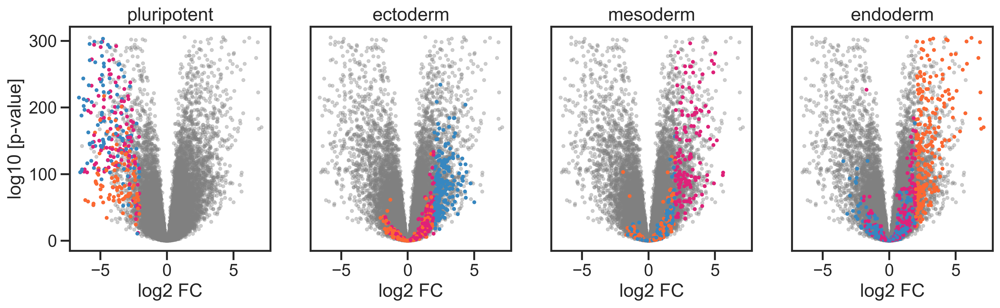

In [201]:
fig,ax = plt.subplots(1,4,figsize = (16,4),gridspec_kw={'width_ratios':[0.2,0.2,0.2,0.2]})
plots = [pluri,ecto,meso,endo]
titles = ['pluripotent','ectoderm','mesoderm','endoderm']
for num,p in enumerate(plots):
    sns.scatterplot(data = diff_exp,
                   x = 'log2FC',s=12,edgecolor = None,
                    ax=ax[num],
                   y = 'p_log10',alpha = 0.4,
                   c = 'grey')
    
    sns.scatterplot(data = diff_exp.loc[p],
                   x = 'log2FC',s=12,edgecolor = None,
                   y = 'p_log10',
                   hue = 'end',
                    ax=ax[num],
                    hue_order = lin_colors.keys(),
                   palette = lin_colors.values() )
    ax[num].legend([],frameon=False)
    ax[num].set_title(titles[num])
    ax[num].set_ylabel('log10 [p-value]')
    ax[num].set_xlabel('log2 FC')
    if num != 0:
        ax[num].set_ylabel('')
        ax[num].set_yticks([])
   
plt.savefig('figs/volcanoes_diffexpressed.png', bbox_inches='tight')
plt.show()

## GO analysis plots

In [41]:
allgenes = list(diff_exp.index.unique())

In [188]:
def plotGO(genelist, reflist, n = 10, save = None, source = 'GO:BP'):
    plotcl = sc.queries.enrich({'cluster':genelist,
                   'all':reflist}, org="mmusculus")
    cluster = 'cluster'
    plot1 = plotcl[plotcl['query'] == cluster][plotcl[plotcl['query'] == cluster]['source'] == source].sort_values(by='p_value')[['name','p_value']][0:n]
    plot1['-log (p-value)'] = np.log10(plot1['p_value'])*-1
    sns.set_style('ticks')
    sns.set_context('talk')
    fig,ax = plt.subplots(figsize = (6,3))
    ax = sns.barplot(y=plot1['name'],x=plot1['-log (p-value)'], ax=ax,color = 'grey')
    ax.set_ylabel('')
    if save != None:
        plt.savefig(save , bbox_inches='tight')
    #sns.despine()
    plt.show()

0


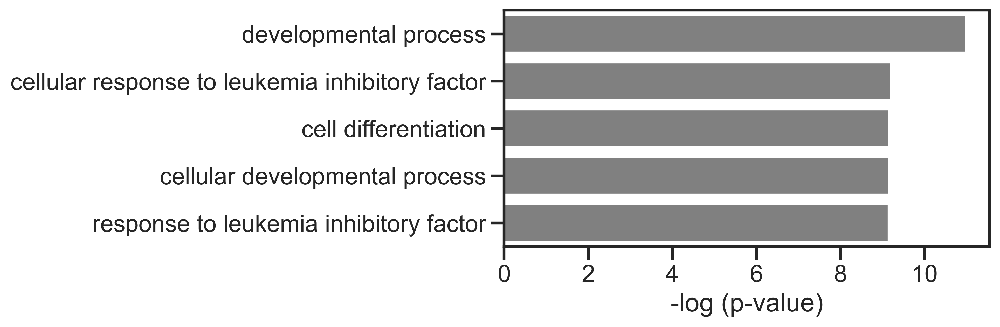

1


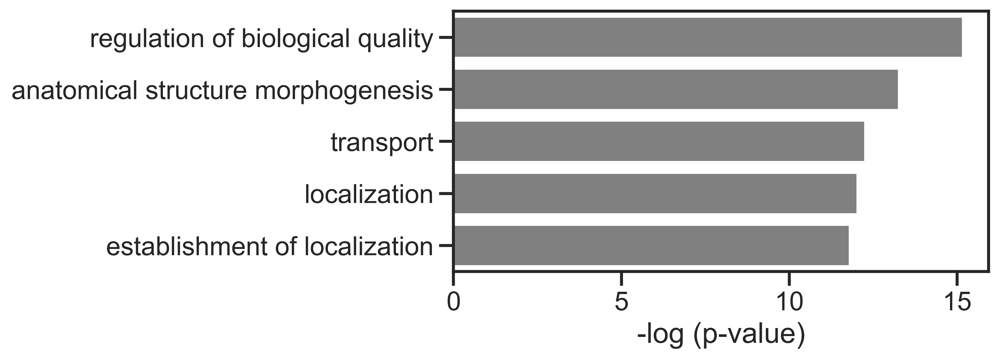

2


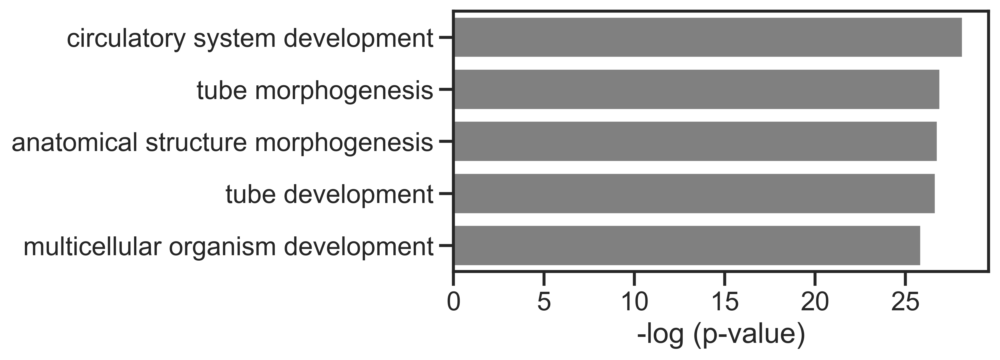

3


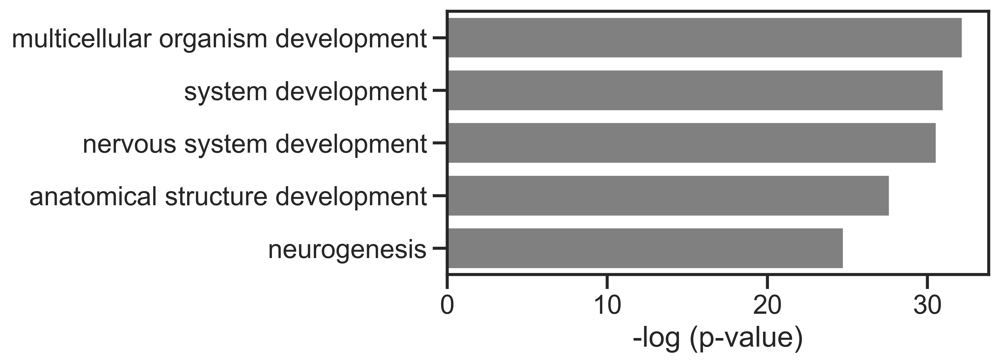

In [191]:
plot_lists = [pluri,endo,meso,ecto]
for num,genelist in enumerate(plot_lists):
    print(num)
    plotGO(genelist,allgenes, n = 5,
           save = 'figs/GO_plot_genelist_' +str(num)+'.png')

101


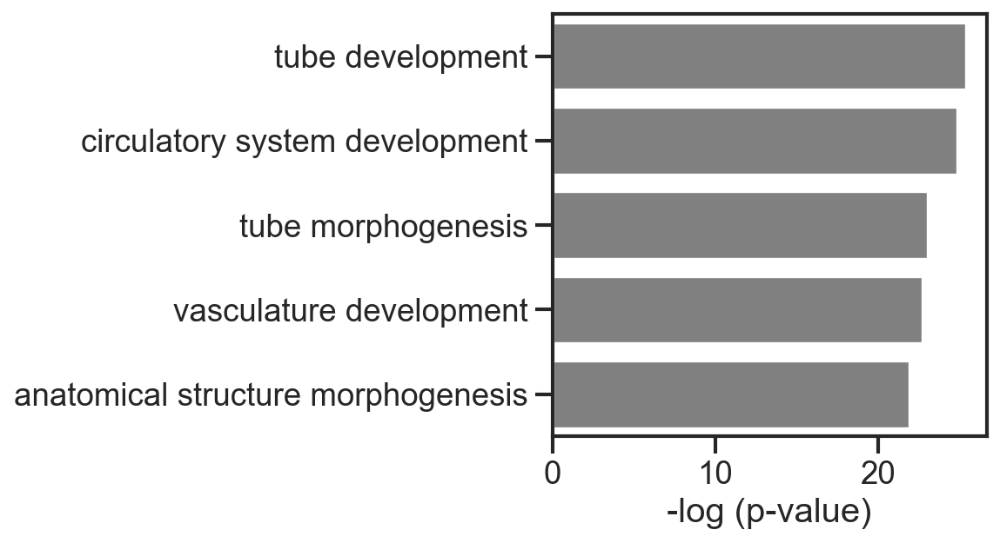

92


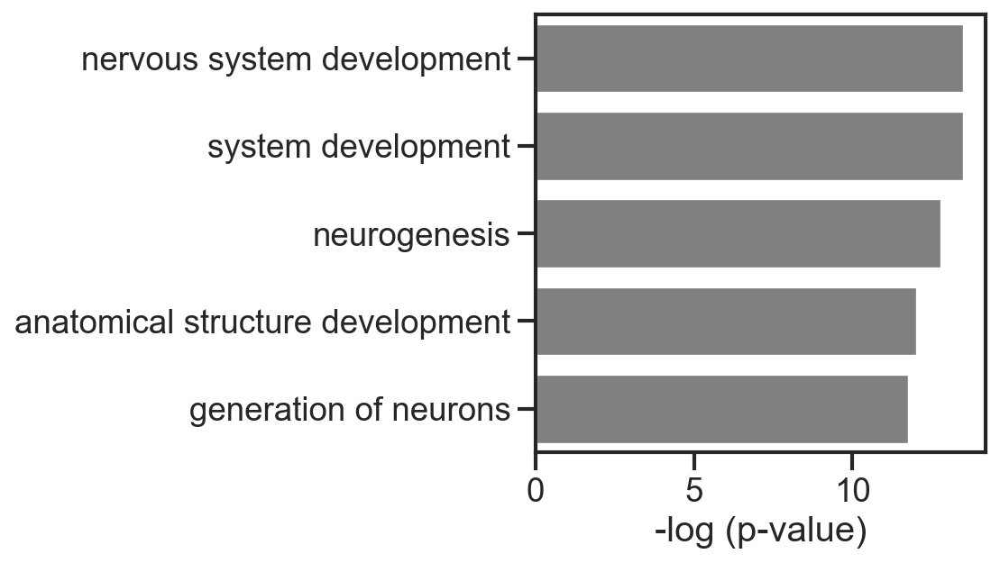

33


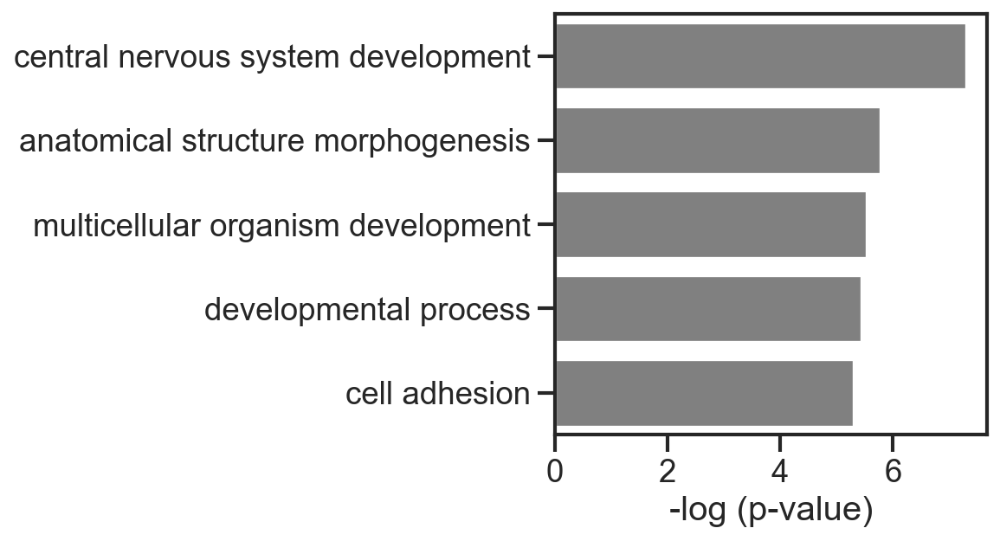

14


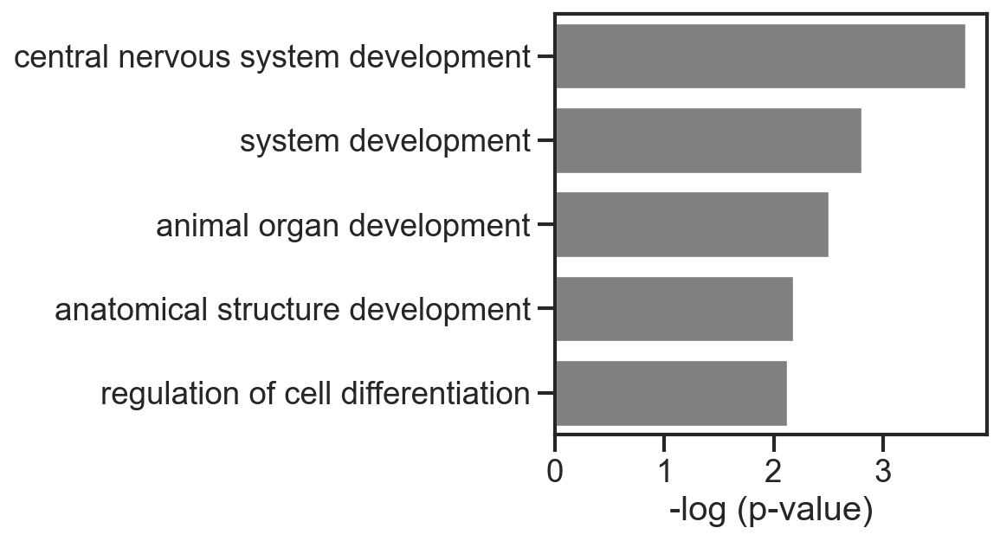

In [54]:
x = list(set(meso_all)&set(endo_all))
print(len(x))
plotGO(x,allgenes, n = 5)

x = list(set(meso_all)&set(ecto_all))
print(len(x))
plotGO(x,allgenes, n = 5)

x = list(set(ecto_all)&set(endo_all))
print(len(x))
plotGO(x,allgenes, n = 5)

x = list(set(meso_all)&set(endo_all)&set(ecto_all))
print(len(x))
plotGO(x,allgenes, n = 5)

In [44]:
plot_1 = sc.queries.enrich({'cluster':pluri,'all':allgenes}, org="mmusculus")
plot_2 = sc.queries.enrich({'cluster':endo,'all':allgenes}, org="mmusculus")
plot_3 = sc.queries.enrich({'cluster':meso,'all':allgenes}, org="mmusculus")
plot_4 = sc.queries.enrich({'cluster':ecto,'all':allgenes}, org="mmusculus")

In [45]:
plot_1[plot_1['source'] == 'TF']['name'].value_counts().head(10)

name
Factor: FOXN4; motif: NNWANNCGWMCGCGTCNNNNMT              2
Factor: Egr-3; motif: NTGCGTGGGCGK                        2
Factor: Sp1; motif: NNGGGGCGGGGNN                         2
Factor: Hes1; motif: NNCACGYGNN                           2
Factor: BEN; motif: CAGCGRNV; match class: 1              2
Factor: GKLF; motif: NNNRGGNGNGGSN                        2
Factor: Sp1; motif: GGGGCGGGGC                            2
Factor: Tcfap2b; motif: NYGCCYNARGGCAN; match class: 1    2
Factor: Egr-1; motif: GCGGGGGCGG                          2
Factor: E2F-4; motif: NTTTCSCGCC; match class: 1          2
Name: count, dtype: int64

In [46]:
plot_2[plot_2['source'] == 'TF']['name'].value_counts().head(10)

name
Factor: Egr-1; motif: GCGGGGGCGG                        4
Factor: Egr-1; motif: GCGGGGGCGG; match class: 1        3
Factor: WT1; motif: CGCCCCCNCN; match class: 1          2
Factor: CKROX; motif: SCCCTCCCC                         2
Factor: CPBP; motif: SNCCCNN; match class: 1            2
Factor: Zic2; motif: NMCCCCCGGGGGGGN                    2
Factor: SP1; motif: GGGGYGGGGNS                         2
Factor: MOVO-B; motif: GNGGGGG; match class: 1          2
Factor: AP-2gamma; motif: GCCYNCRGSN; match class: 1    2
Factor: CACD; motif: CCACRCCC                           2
Name: count, dtype: int64

In [47]:
plot_3[plot_3['source'] == 'TF']['name'].value_counts().head(10)

name
Factor: E2F; motif: TTTSGCGSG                             2
Factor: GKLF; motif: NNRRGRRNGNSNNN; match class: 1       2
Factor: GKLF; motif: NNRRGRRNGNSNNN                       2
Factor: WT1; motif: NNGGGNGGGSGN; match class: 1          2
Factor: CTCF; motif: NAGGGGGCGCNNKNNNN; match class: 1    2
Factor: E2F; motif: TTTSGCGSG; match class: 1             2
Factor: LRF; motif: GGGGKYNNB                             2
Factor: WT1; motif: SMCNCCNSC; match class: 1             2
Factor: BEN; motif: CAGCGRNV; match class: 1              2
Factor: Kaiso; motif: SARNYCTCGCGAGAN                     2
Name: count, dtype: int64

In [48]:
plot_4[plot_4['source'] == 'TF']['name'].value_counts().head(10)

name
Factor: E2F; motif: TTTSGCGSG                                   4
Factor: Egr-1; motif: GCGGGGGCGG                                4
Factor: Egr-1; motif: GCGGGGGCGG; match class: 1                3
Factor: E2F; motif: TTTSGCGSG; match class: 1                   3
Factor: VDR; motif: GGGKNARNRRGGWSA; match class: 1             2
Factor: GKLF; motif: NNNRGGNGNGGSN                              2
Factor: Sp5; motif: RNGGRGGNGGRGNNGGGGGAGGRG; match class: 1    2
Factor: AP-2gamma; motif: GCCYNNGGS; match class: 1             2
Factor: Kaiso; motif: SARNYCTCGCGAGAN                           2
Factor: E2F; motif: NKCGCGCSAAAN                                2
Name: count, dtype: int64

In [49]:
plot_1['source'].unique()

array(['TF', 'GO:CC', 'GO:BP', 'GO:MF', 'HP', 'REAC', 'WP', 'KEGG',
       'MIRNA', 'CORUM'], dtype=object)

0


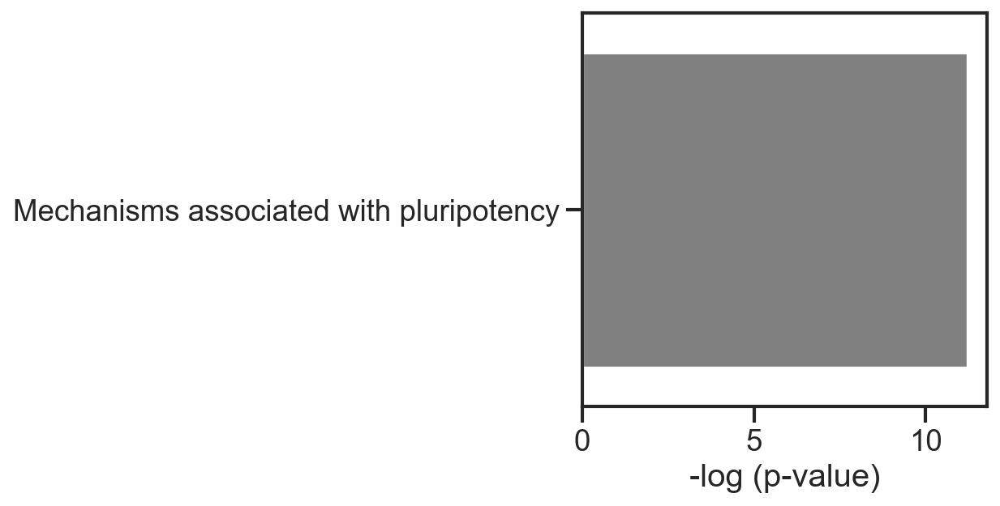

1


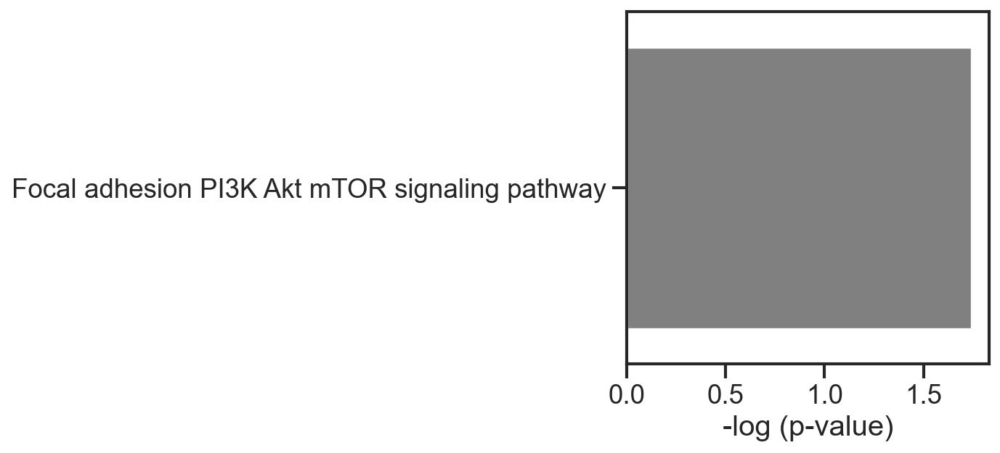

2


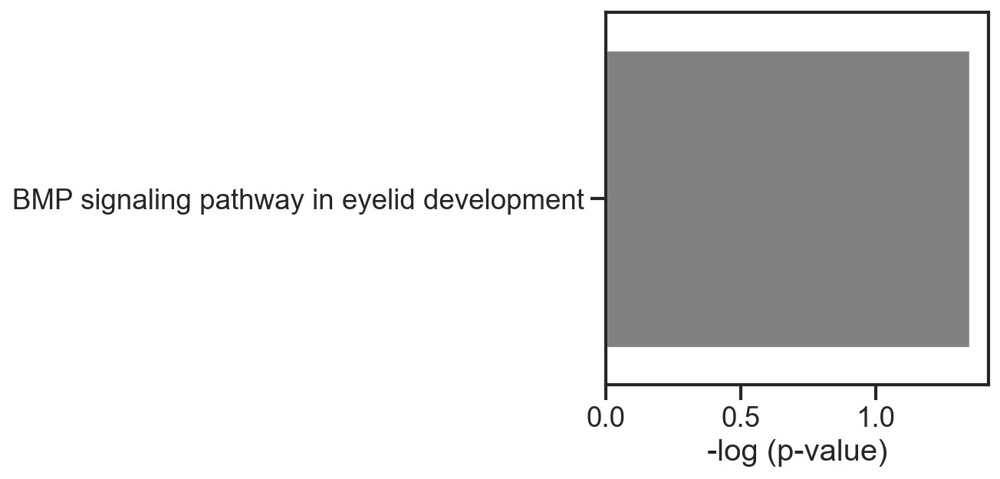

3


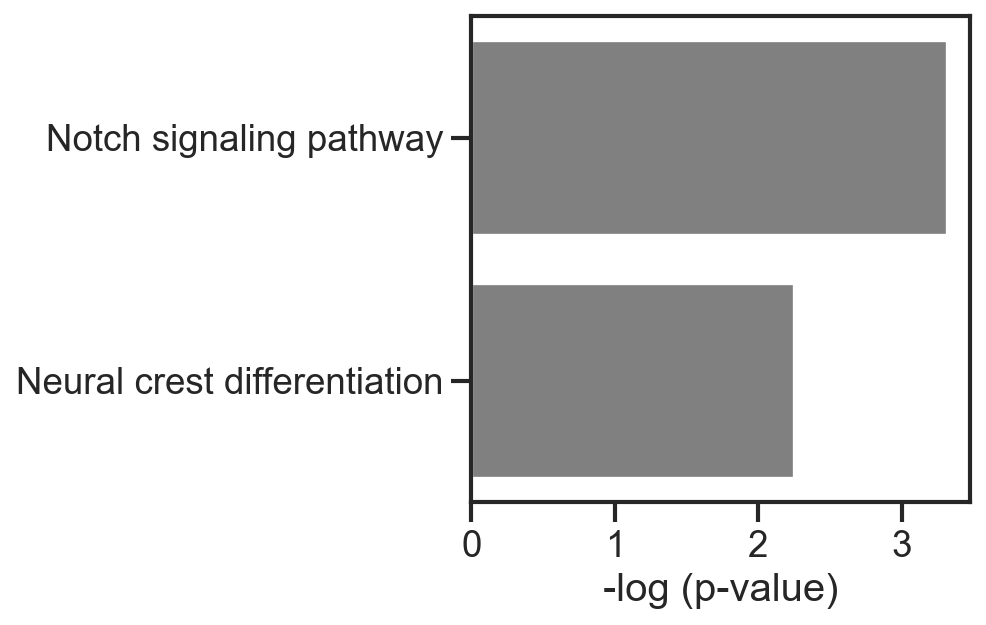

In [55]:
plot_lists = [pluri,endo,meso,ecto]
for num,genelist in enumerate(plot_lists):
    print(num)
    plotGO(genelist,allgenes, n = 10, source = 'WP')
           #save = 'GO_plot_genelist_' +str(num)+'.png')

## start decoupler

In [60]:
progeny = dc.get_progeny(organism='mouse', top=500)
progeny.to_csv('20250224_progeny_export.csv')
progeny

/Users/mbloten1/miniconda3/envs/conda_base/lib/python3.10/site-packages/liana/resource/_orthology.py:199: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.


,source,target,weight,p_value
0,Androgen,Tmprss2,11.490631,0.0
1,Androgen,Nkx3-1,10.622551,0.0
2,Androgen,Mboat2,10.472733,0.0
3,Androgen,Slc38a4,7.363805,0.0
4,Androgen,Mtmr9,6.130646,0.0
...,...,...,...,...
6995,p53,Wnt9a,1.932573,0.000002
6996,p53,Syk,1.903886,0.000002
6997,p53,Cdo1,1.934397,0.000002
6998,p53,Wbp11,-2.148036,0.000002


In [86]:
dorothea = dc.get_dorothea(organism='mouse')
dorothea.to_csv('20250224_dorothea_export.csv')
dorothea

/Users/mbloten1/miniconda3/envs/conda_base/lib/python3.10/site-packages/liana/resource/_orthology.py:199: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.


,source,target,weight,confidence
0,Myc,Tert,1.0,A
1,Zeb1,Ar,-1.0,A
2,Stat1,Igfbp3,1.0,A
3,Ets1,Cd4,1.0,A
4,Foxa1,Rprm,-1.0,A
...,...,...,...,...
30663,Nfe2,Kcnma1,0.333333,C
30664,Irf1,Ube2l6,0.333333,C
30665,Cdx2,Pdlim5,0.333333,C
30666,Cdx2,Mylk,0.333333,C


In [68]:
collectri = dc.get_collectri(organism='mouse', split_complexes=False)
collectri.to_csv('20250224_collectri_export.csv')
collectri

/Users/mbloten1/miniconda3/envs/conda_base/lib/python3.10/site-packages/liana/resource/_orthology.py:199: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.


,source,target,weight
0,AP1,Aanat,1
1,AP1,Abca1,-1
2,AP1,Abcb11,1
3,AP1,Abcc1,1
4,AP1,Abcc3,1
...,...,...,...
36862,Zxdc,Cdkn1c,1
36863,Zxdc,Cdkn2a,1
36864,Zxdc,Ciita,1
36865,Zxdc,H2-T23,1


In [80]:
progeny[progeny['source'] == 'Androgen']['weight'].sum()

np.float64(647.3917980790138)

In [81]:
total_vals = {}
for val in progeny['source'].unique():
    total_vals[val] = progeny[progeny['source'] == val]['weight'].sum()
    

In [82]:
total_vals

{'Androgen': np.float64(647.3917980790138),
 'EGFR': np.float64(-35.09046548604965),
 'Estrogen': np.float64(88.4927521944046),
 'Hypoxia': np.float64(470.3530886769295),
 'JAK-STAT': np.float64(992.3941367566586),
 'MAPK': np.float64(331.16528540849686),
 'NFkB': np.float64(1395.3695748448372),
 'PI3K': np.float64(-1182.8732509613037),
 'TGFb': np.float64(759.2430869936943),
 'TNFa': np.float64(1452.3976613283157),
 'Trail': np.float64(106.02493071556091),
 'VEGF': np.float64(92.5765620470047),
 'WNT': np.float64(113.4458355307579),
 'p53': np.float64(320.22364354133606)}

In [87]:
meso_vals = {}
endo_vals = {}
ecto_vals = {}
for val in progeny['source'].unique():
    df1 = progeny[progeny['target'].isin(meso)]
    meso_vals[val] = df1[df1['source'] == val]['weight'].sum()
    
    df2 = progeny[progeny['target'].isin(endo)]
    endo_vals[val] = df2[df2['source'] == val]['weight'].sum()
    
    df3 = progeny[progeny['target'].isin(ecto)]
    ecto_vals[val] = df3[df3['source'] == val]['weight'].sum()

In [101]:
all_vals = pd.DataFrame([endo_vals]).T.rename(columns={0:'endoderm'}).join(pd.DataFrame([meso_vals]).T.rename(columns={0:'mesoderm'})).join(pd.DataFrame([ecto_vals]).T.rename(columns={0:'ectoderm'}))
all_vals

,endoderm,mesoderm,ectoderm
Androgen,45.202270,3.841824,-8.502247
EGFR,-7.586890,5.200671,0.588112
Estrogen,8.611829,15.394166,17.475152
Hypoxia,37.839871,0.000000,9.655986
JAK-STAT,16.286276,5.639945,1.633397
MAPK,-9.309888,8.264811,-7.616807
NFkB,27.576911,7.141523,6.115138
PI3K,-29.582735,-3.964017,1.860249
TGFb,37.965840,41.190181,9.392149
TNFa,26.798542,10.432476,5.181268


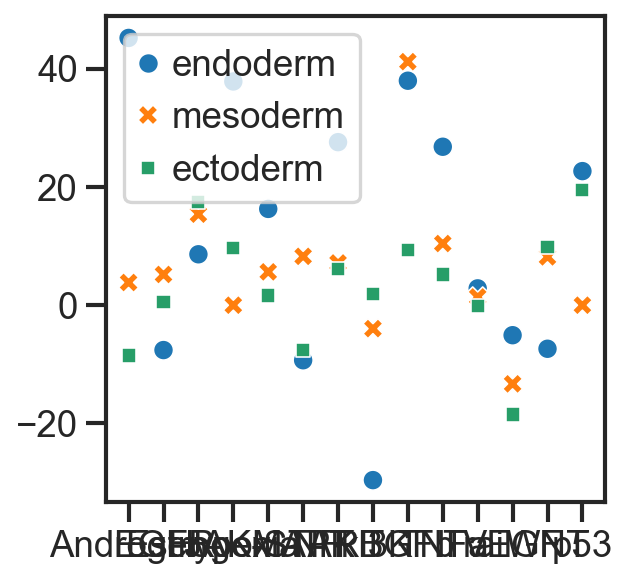

In [104]:
sns.scatterplot(data=all_vals, )
plt.show()

In [183]:
def decoupler_defaults(lineage):
    dc.plot_volcano_df(
        diff_exp[diff_exp['end'] == lineage],
        x='log2FC',
        y='padj',
        top=20,
        figsize=(6, 6)
    )
    plt.show()

    mat = diff_exp[diff_exp['end'] == lineage][['stat']].T.rename(index={'stat': lineage})

    tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri)

    dc.plot_barplot(
    acts=tf_acts,
    contrast=lineage,
    top=25,
    vertical=True,
    figsize=(3, 6)
    )
    plt.savefig('figs/decoupler_barplot_' + str(lineage) + '.png', bbox_inches = 'tight')
    plt.show()

    top_5 = list(tf_acts.T.sort_values(by=lineage)[0:5].index)
    bottom_5 = list(tf_acts.T.sort_values(by=lineage)[-5:].index)

    dc.plot_network(
        net=collectri,
        obs=mat,
        act=tf_acts,
        n_sources=top_5,
        n_targets=15,
        node_size=100,
        figsize=(7, 7),
        c_pos_w='darkgreen',
        c_neg_w='darkred',
        vcenter=True
    )
    
    plt.show()

    dc.plot_network(
        net=collectri,
        obs=mat,
        act=tf_acts,
        n_sources=bottom_5,
        n_targets=15,
        node_size=100,
        figsize=(7, 7),
        c_pos_w='darkgreen',
        c_neg_w='darkred',
        vcenter=True
    )
    plt.savefig('figs/decoupler_network_' + str(lineage) + '.png', bbox_inches = 'tight')
    
    plt.show()


In [179]:
diff_exp['stat2'] = diff_exp['stat']
diff_exp['stat'] = -diff_exp['stat']
diff_exp.head(2)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,start,end,log2FC,p_log10,stat2
Gene,,,,,,,,,,,
0610012G03Rik,17.511469,-0.091064,0.079912,1.139552,2.544732e-01,2.768738e-01,Pluripotent,Mesoderm,0.091064,0.557718,-1.139552
0610030E20Rik,23.701250,-0.350503,0.050457,6.946514,3.744240e-12,6.933019e-12,Pluripotent,Mesoderm,0.350503,11.159078,-6.946514


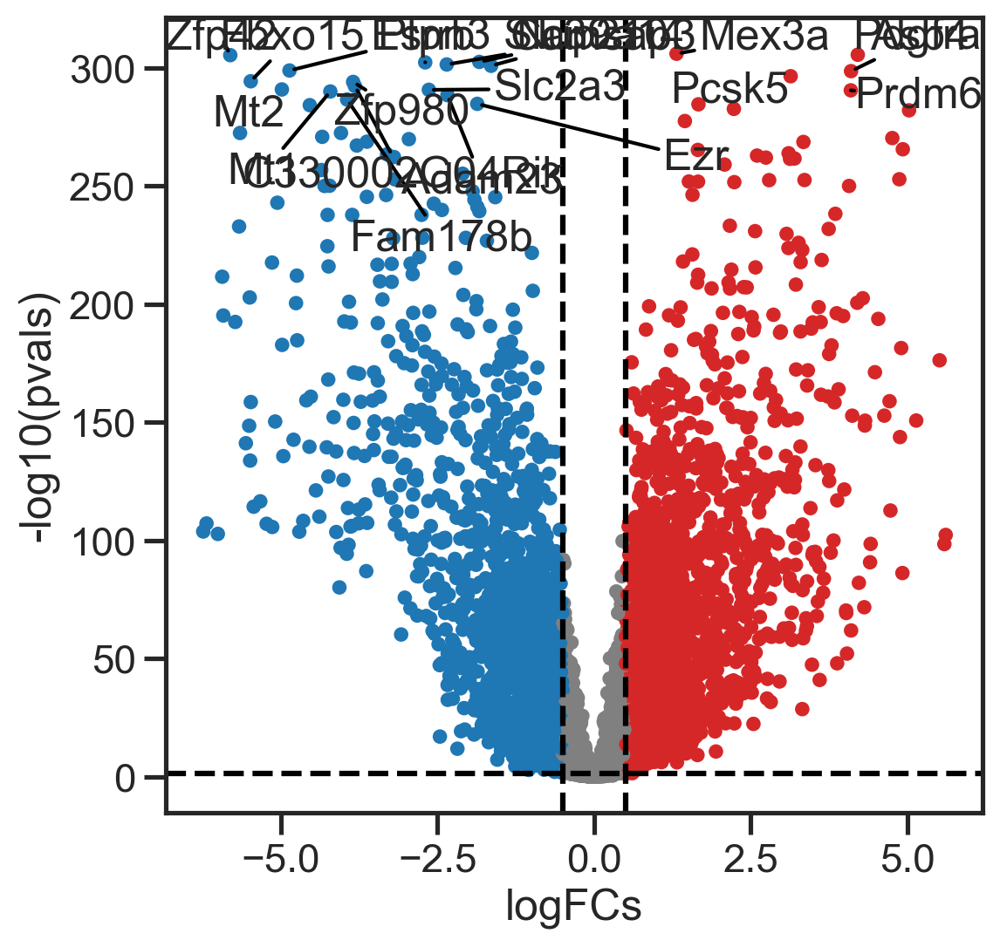

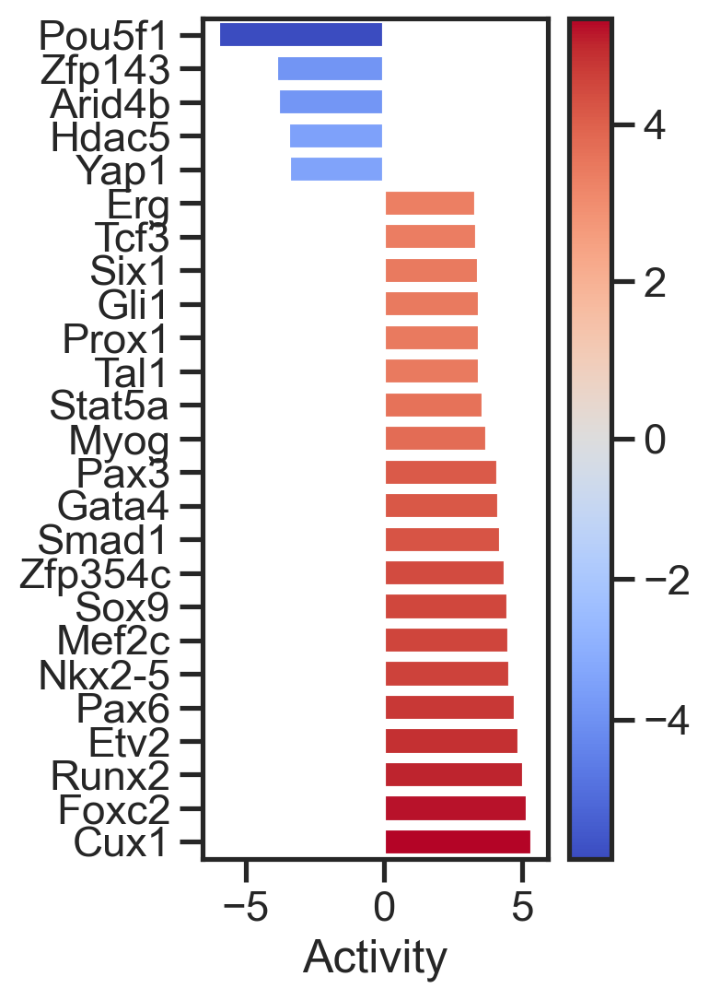

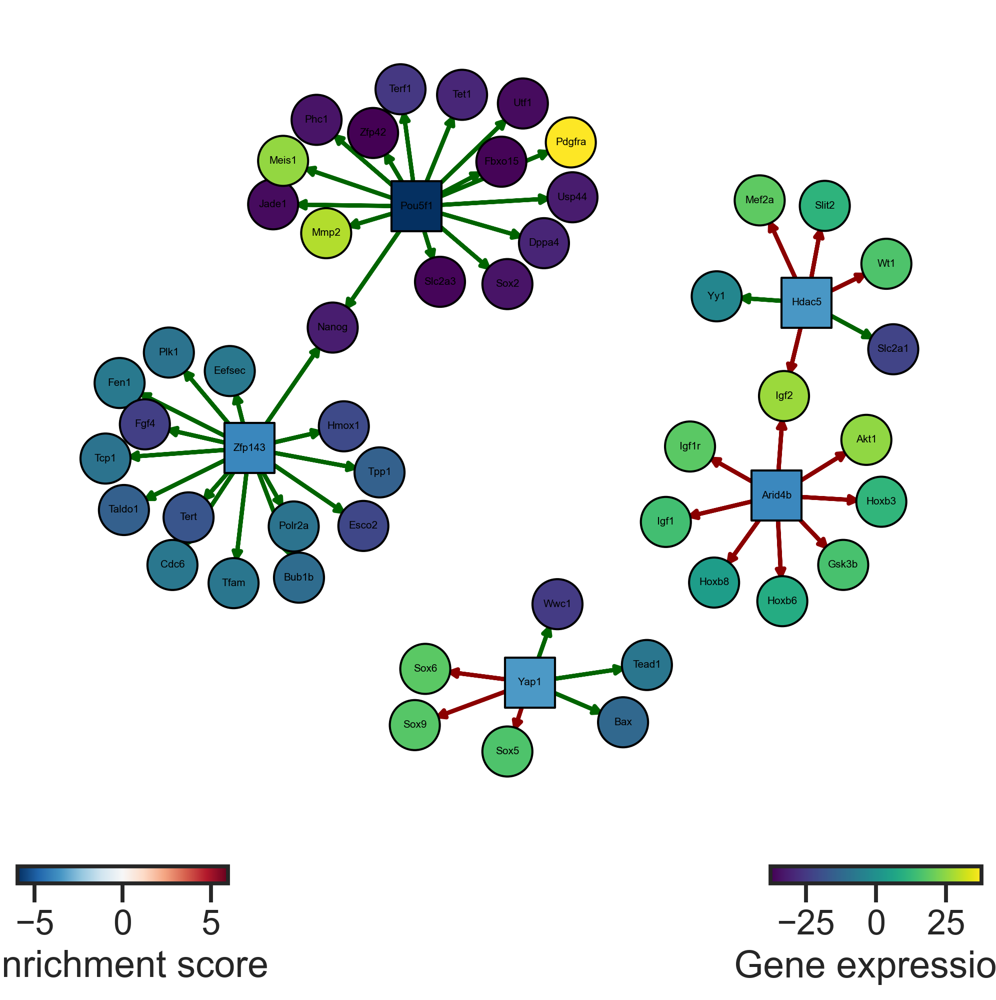

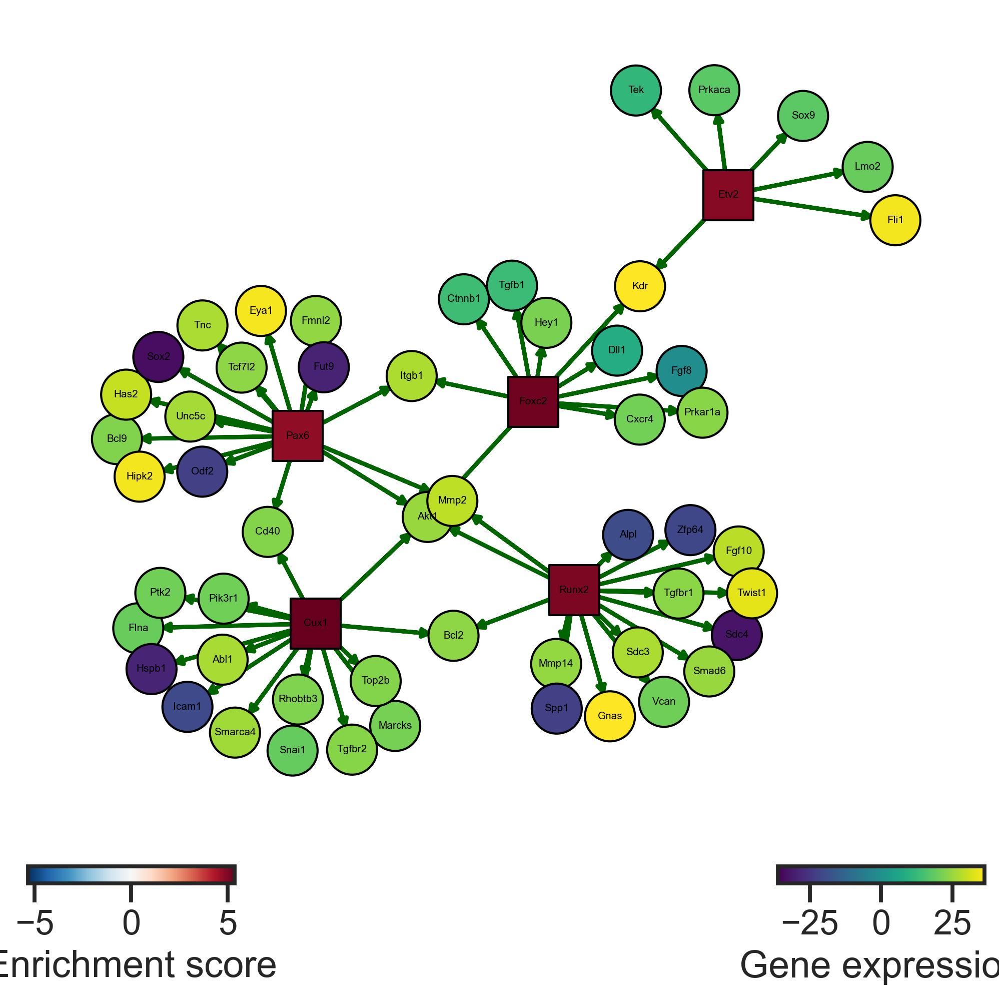

In [185]:
decoupler_defaults('Mesoderm')

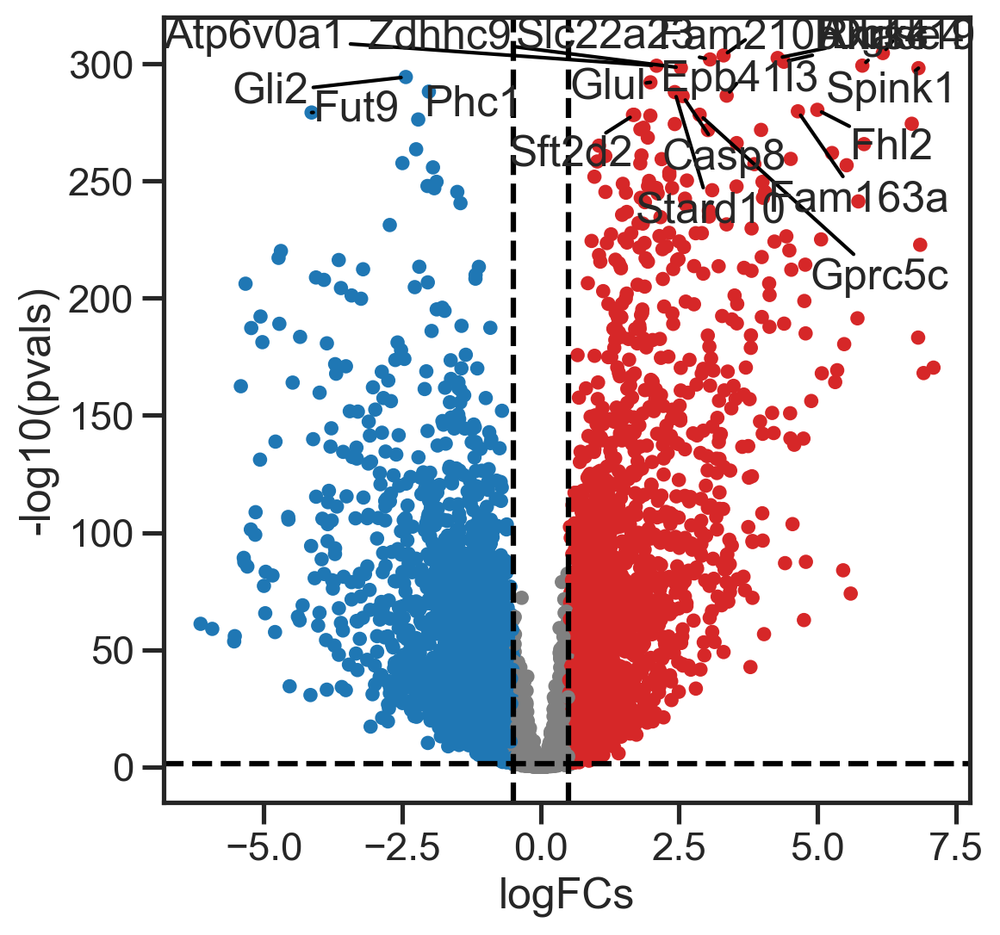

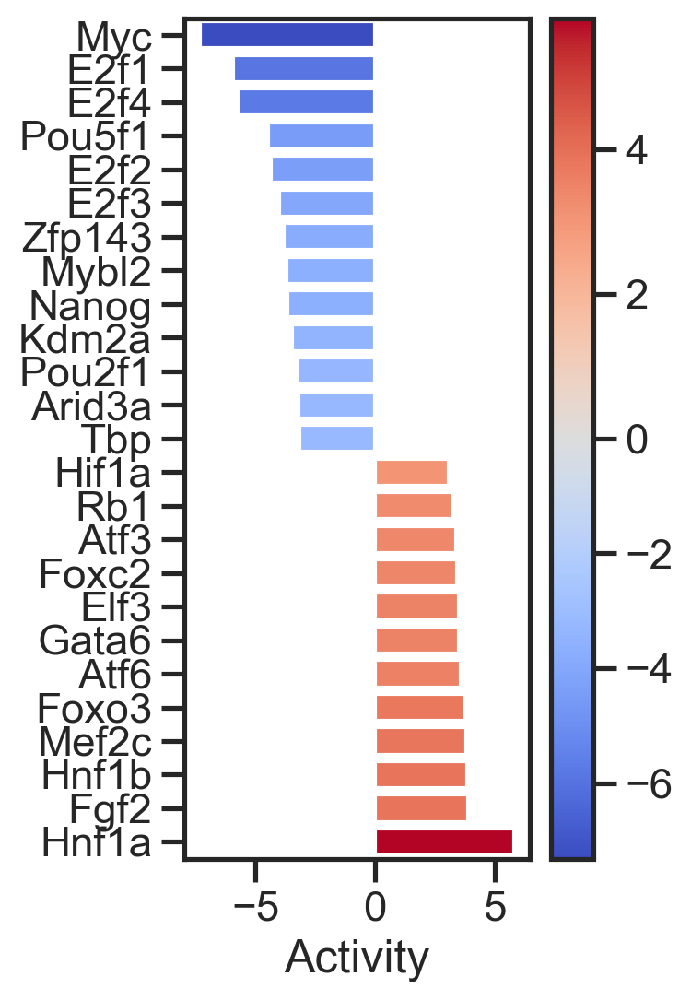

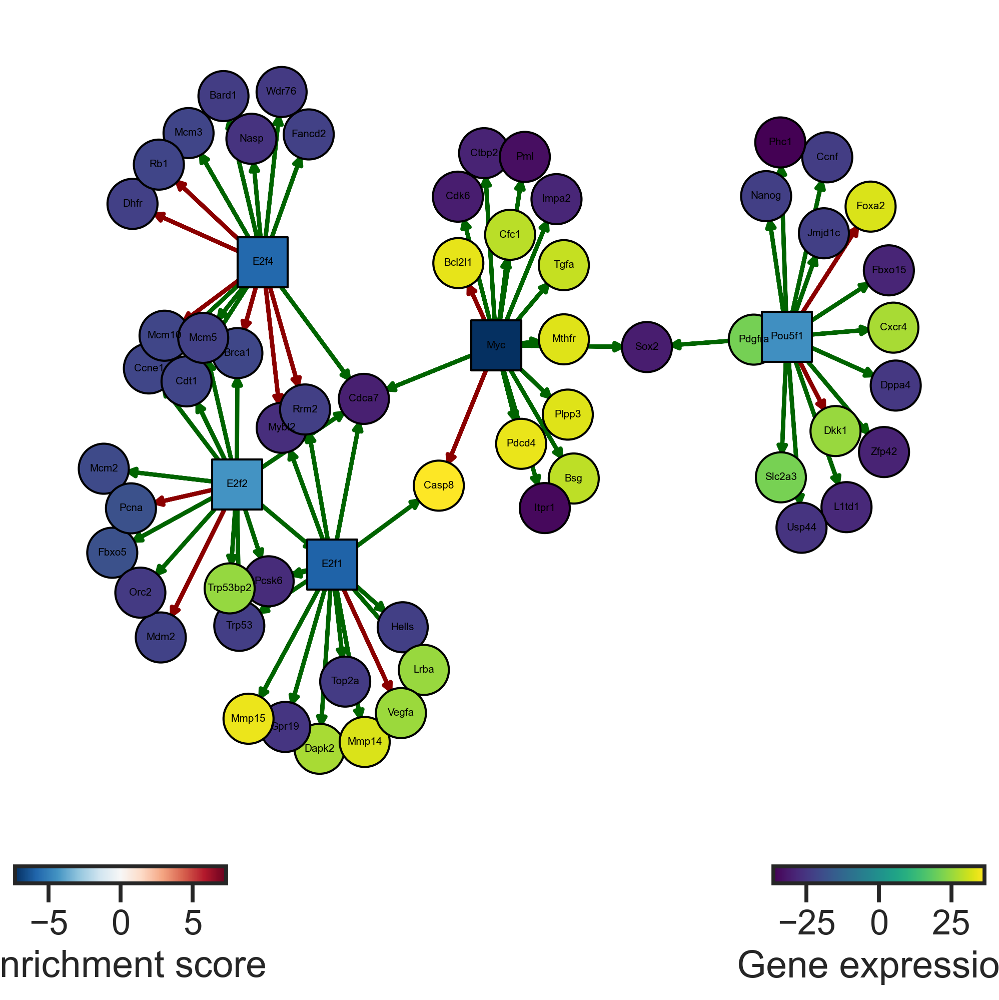

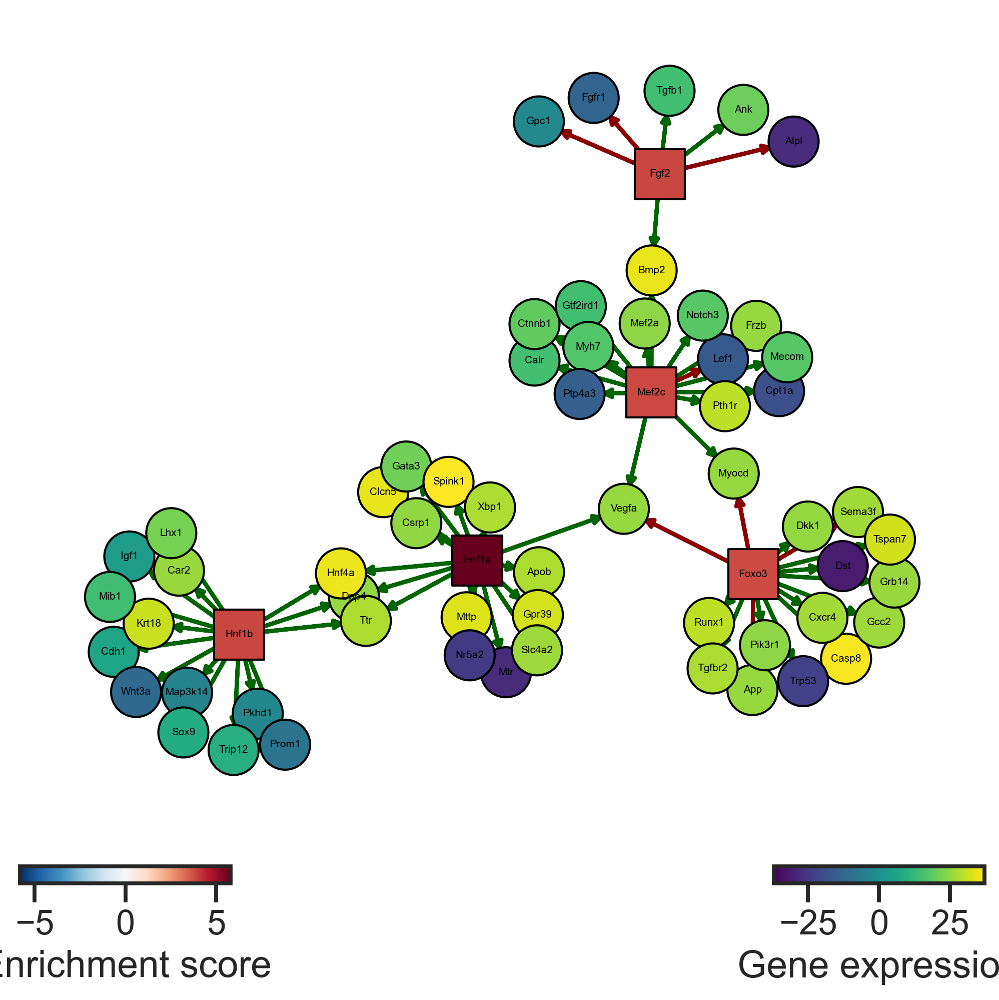

In [186]:
decoupler_defaults('Endoderm')

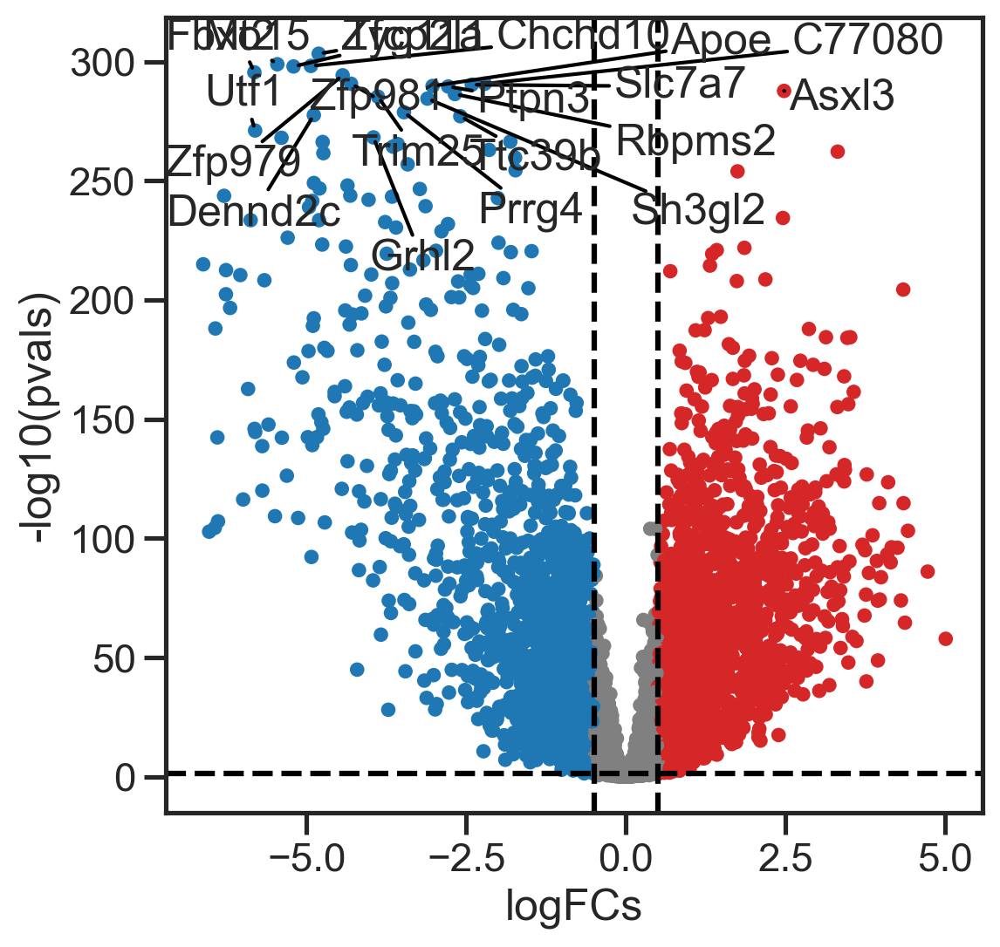

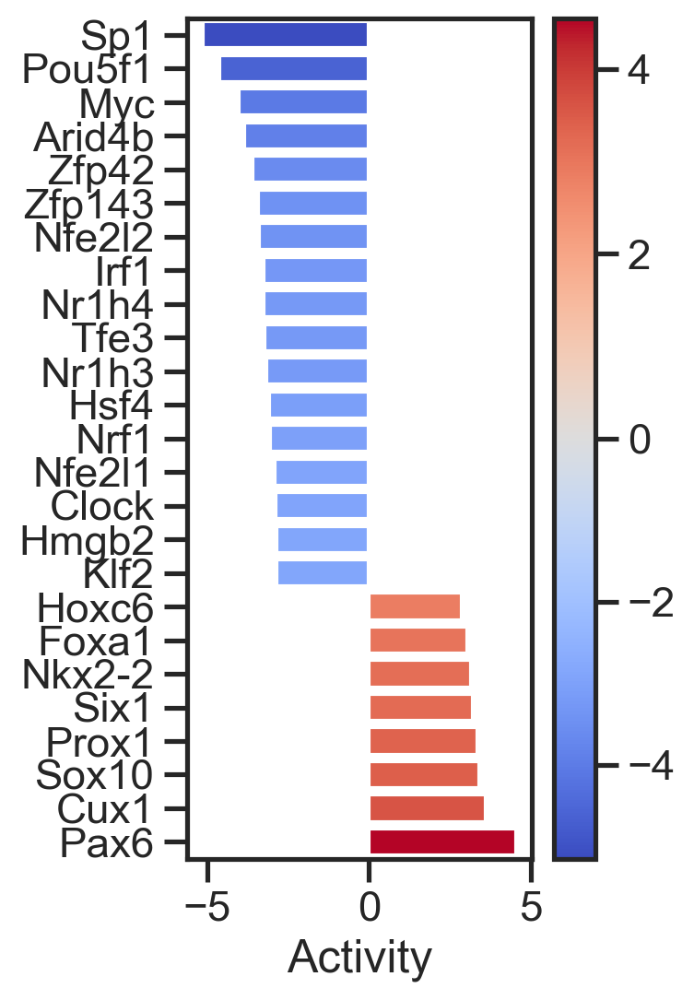

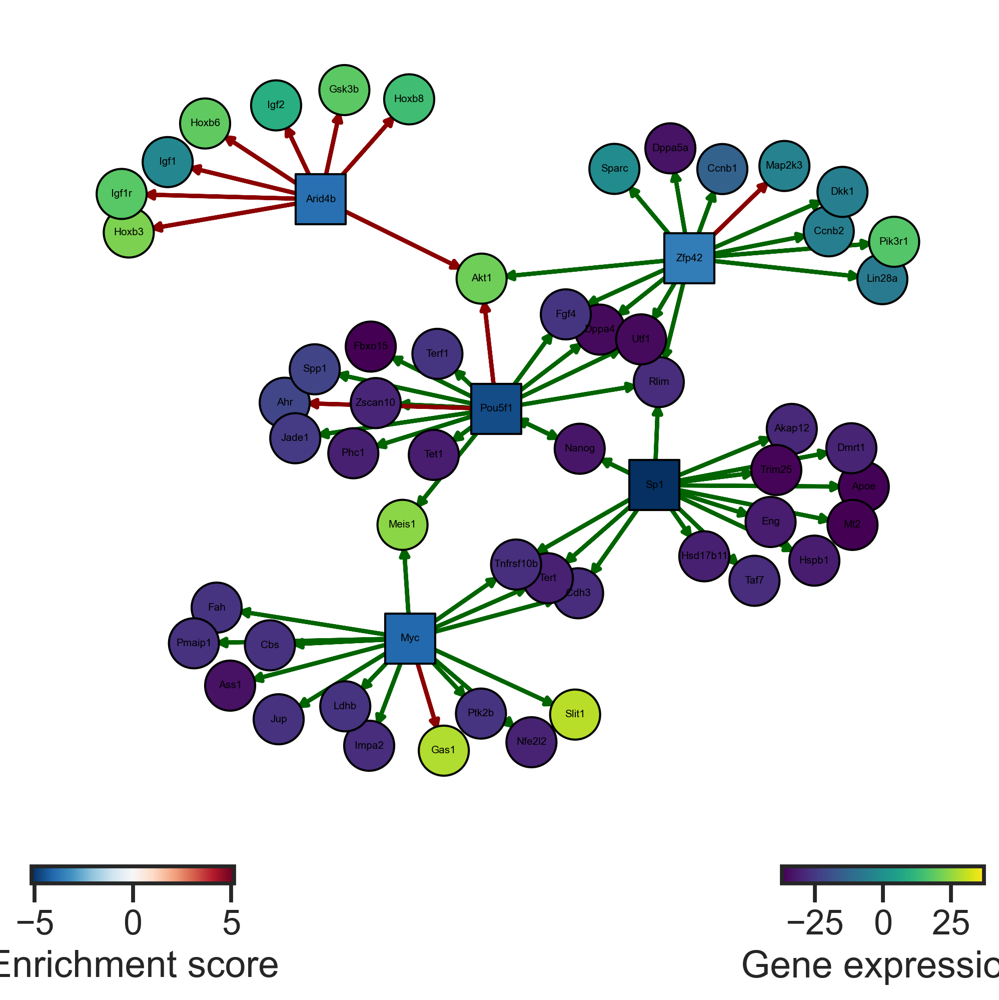

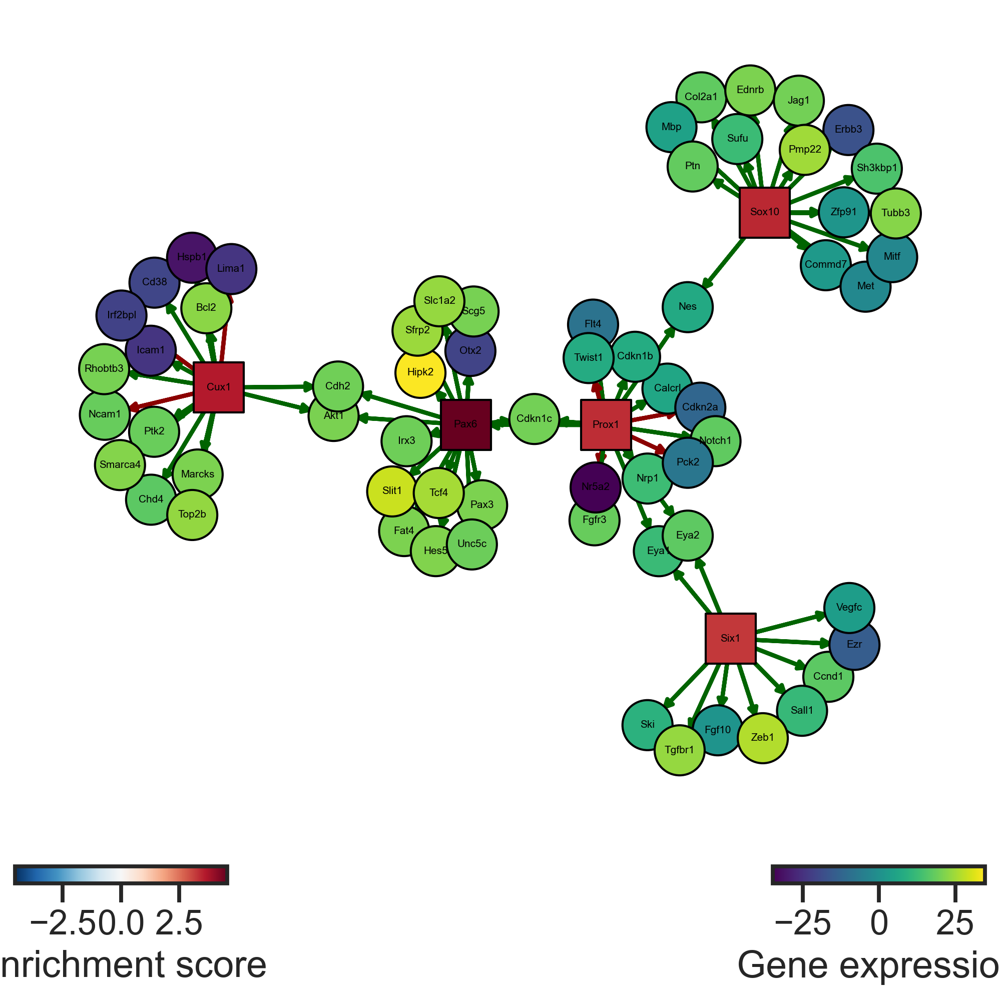

In [187]:
decoupler_defaults('Ectoderm')

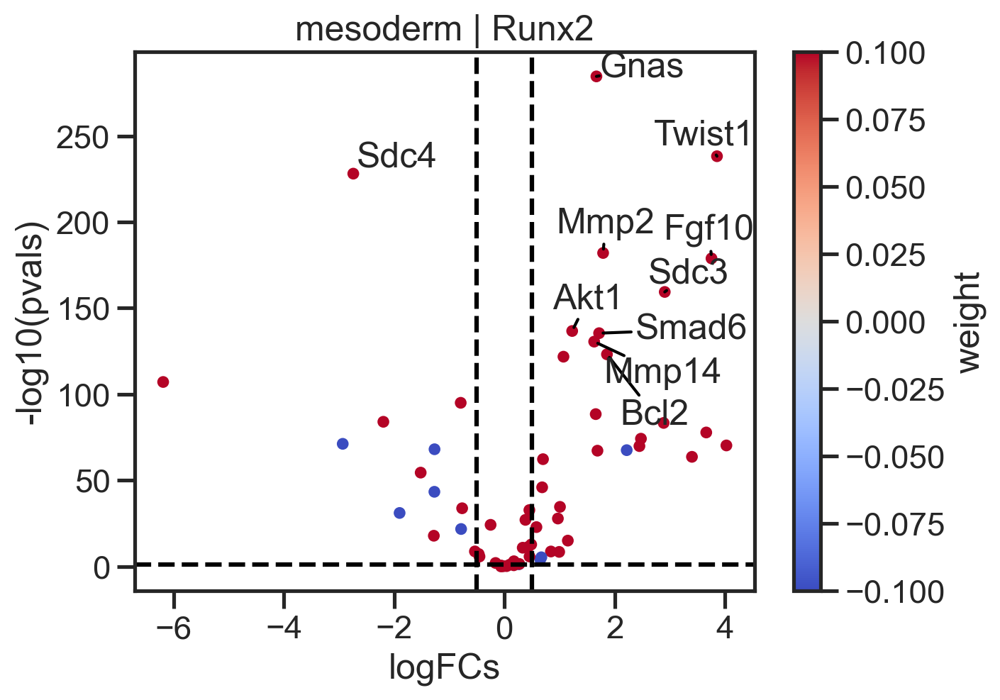

In [135]:
# Extract logFCs and pvals
logFCs = diff_exp[diff_exp['end'] == 'Mesoderm'][['log2FC']].T.rename(index={'log2FC': 'mesoderm'})
pvals = diff_exp[diff_exp['end'] == 'Mesoderm'][['padj']].T.rename(index={'padj': 'mesoderm'})

# Plot
dc.plot_volcano(
    logFCs=logFCs,
    pvals=pvals,
    contrast='mesoderm',
    name='Runx2',
    net=collectri,
    top=10,
    sign_thr=0.05,
    lFCs_thr=0.5
)

plt.show()

In [151]:
list(tf_acts.T.sort_values(by='mesoderm')[-5:].index)

['Yap1', 'Hdac5', 'Arid4b', 'Zfp143', 'Pou5f1']

In [159]:
collectri[collectri['source'] == 'Pou5f1']

,source,target,weight
24252,Pou5f1,Actg2,-1.0
24253,Pou5f1,Afp,-1.0
24254,Pou5f1,Ahr,-1.0
24255,Pou5f1,Akt1,-1.0
24256,Pou5f1,Birc5,1.0
...,...,...,...
24334,Pou5f1,Utf1,1.0
24335,Pou5f1,Wnt3,-1.0
24336,Pou5f1,Zfp42,1.0
24337,Pou5f1,Zic3,1.0


In [167]:
collectri[collectri['target'].isin(meso)]['source'].unique()

<StringArray>
[   'AP1',    'Ahr',     'Ar', 'Arid4b',   'Arnt',  'Arnt2',    'Arx',
   'Atf3',   'Atf4',  'Atf6b',
 ...
   'Xbp1',   'Ybx1',    'Yy1',   'Zeb2', 'Zfp128',  'Zfp24', 'Zfp362',
 'Zfp382', 'Zfp384', 'Zfp750']
Length: 287, dtype: string

In [ ]:
diff_exp[diff_exp['end'] == 'Mesoderm']

# other

<AxesSubplot:xlabel='mean', ylabel='Count'>

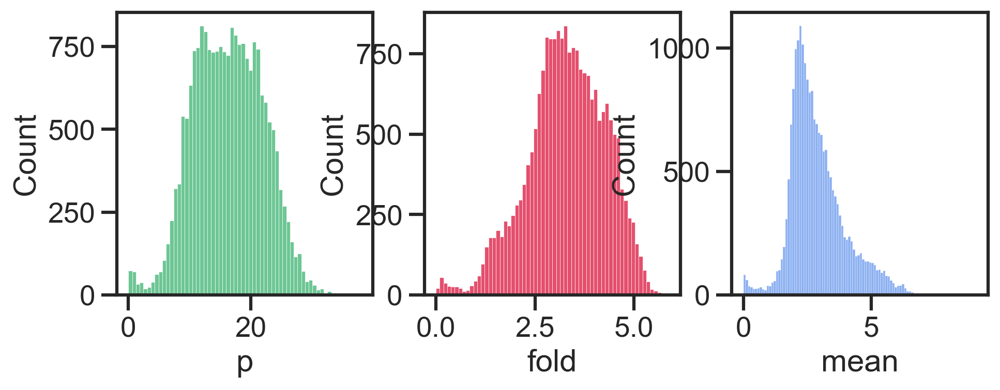

In [132]:
fig,ax = plt.subplots(1,3,figsize = (9,3)) 
                                #gridspec_kw={'hspace': 0.1, 'height_ratios':[2,2,2,2]})
      
ax = ax.flatten()
sns.histplot(anova_k27['p'], color = 'mediumseagreen',ax=ax[0])
sns.histplot(anova_k27['fold'], color = 'crimson',ax=ax[1])
sns.histplot(anova_k27['mean'], color = 'cornflowerblue',ax=ax[2])

#plt.show()

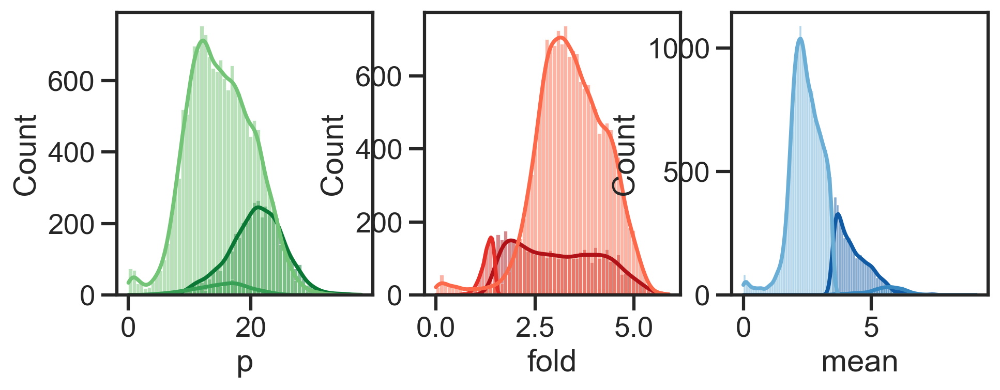

In [127]:
fig,ax = plt.subplots(1,3,figsize = (9,3)) 
                                #gridspec_kw={'hspace': 0.1, 'height_ratios':[2,2,2,2]})
      
ax = ax.flatten()
sns.histplot(x = anova_k27['p'], hue = anova_k27['state'],palette = sns.color_palette('Greens',5)[2:5],kde = True,ax=ax[0])
sns.histplot(x = anova_k27['fold'], hue = anova_k27['state'],palette = sns.color_palette('Reds',5)[2:5],kde = True,ax=ax[1])
sns.histplot(x = anova_k27['mean'], hue = anova_k27['state'], palette = sns.color_palette('Blues',5)[2:5],kde = True,ax=ax[2])
ax[0].legend([],frameon=False)
ax[1].legend([],frameon=False)
ax[2].legend([],frameon=False)
#plt.show()

# QC plots

<AxesSubplot:xlabel='state', ylabel='mean'>

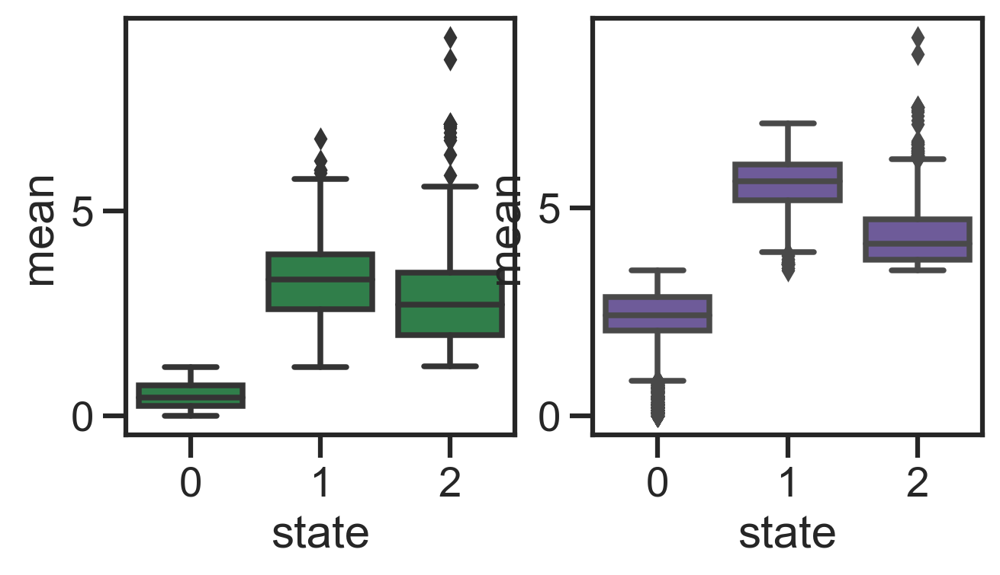

In [99]:
fig,ax = plt.subplots(1,2,figsize = (6,3)) 


sns.boxplot(x = anova_k4['state'].round(1), color = Green,ax=ax[0],
           y = anova_k4['mean'])
sns.boxplot(x = anova_k27['state'].round(1), color = Purple,ax=ax[1],
           y = anova_k27['mean'])


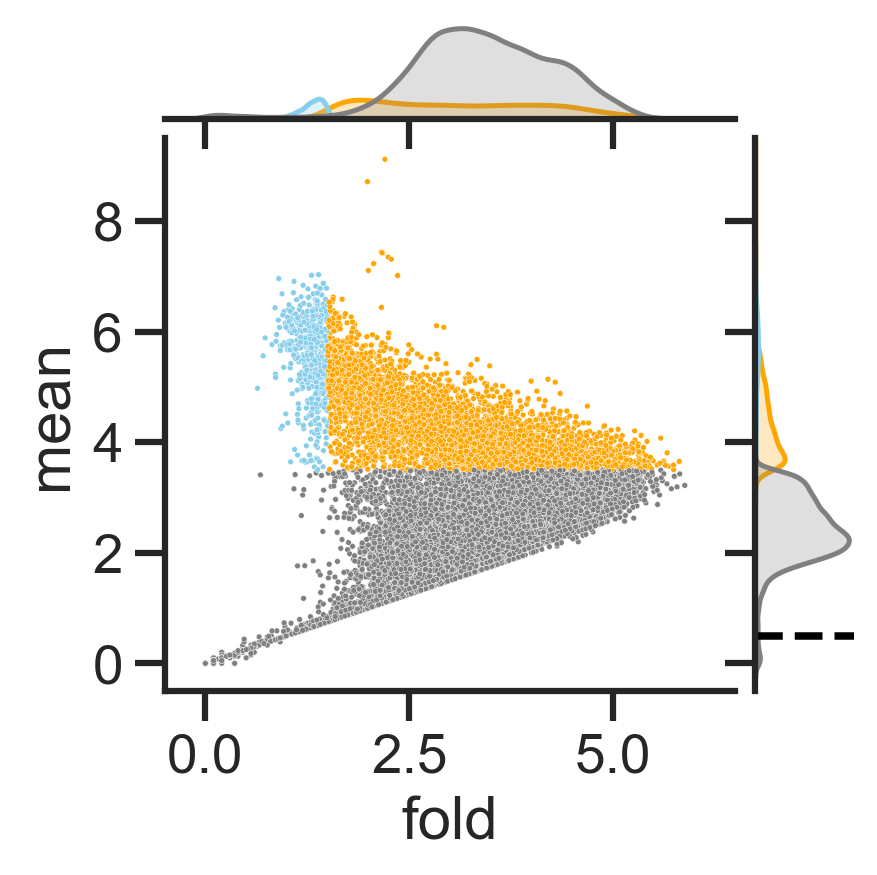

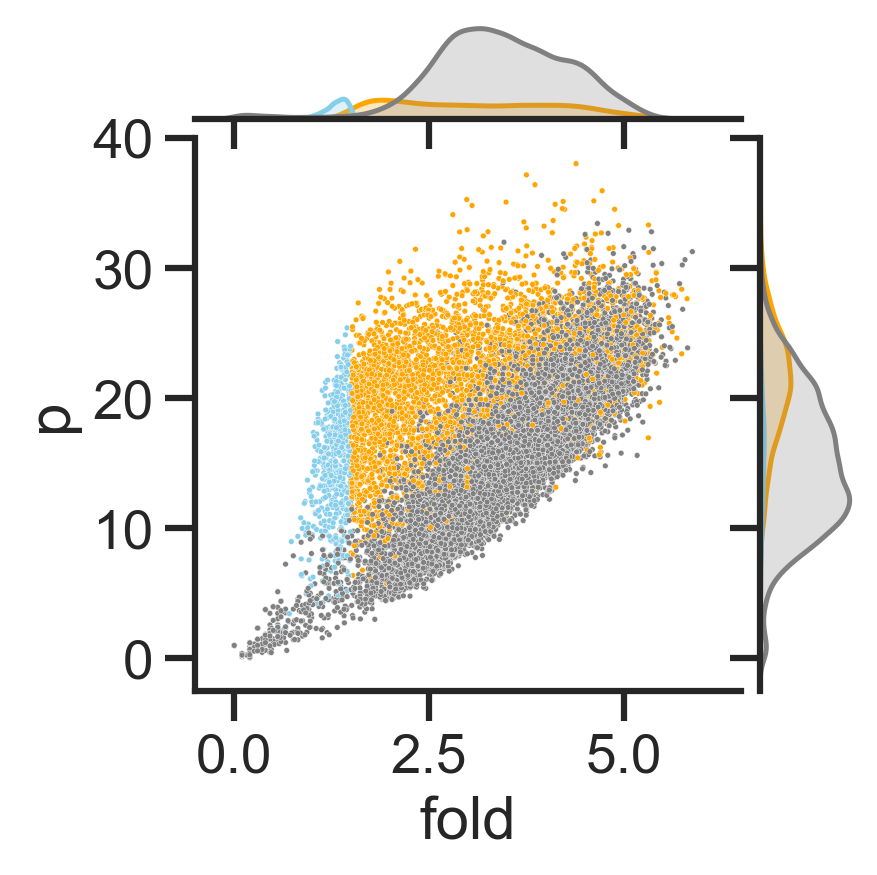

In [141]:
#"scatter" (default), "kde", "hist", "hex", "reg" and "resid".

# all!
kdeplot = sns.jointplot(data = anova_k27,
               x = 'fold',s = 3,
               y = 'mean', kind = 'scatter', 
                        hue = 'state', palette = ['grey', 'skyblue', 'orange'],
                        xlim = [-.5,6.5], ylim = [-.5,9.5],
              height = 4, 
              color = Purple)
plt.axhline(0.5,ls = '--', color = 'black')

#kdeplot.set_axis_labels('', '', fontsize=16)
kdeplot.ax_joint.legend([], frameon = False)


kdeplot = sns.jointplot(data = anova_k27,
               x = 'fold',s = 3,
               y = 'p', kind = 'scatter', 
                        hue = 'state', palette = ['grey', 'skyblue', 'orange'],
                        xlim = [-.5,6.5], ylim = [-2.5,40],
              height = 4, 
              color = Purple)
#kdeplot.set_axis_labels('', '', fontsize=16)
kdeplot.ax_joint.legend([], frameon = False)